In [0]:
#Imports
import torch
import torch.nn as nn
import numpy as np
import torch.optim as optim 
import torch.nn.functional as F
from torchvision import datasets, transforms
import random
from random import shuffle
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
from tabulate import tabulate
import copy
import os, time
import itertools
import pickle
import math
from PIL import Image
from torchvision import transforms, datasets, utils
from torch.autograd import Variable

In [0]:
# Hyper-Parameters

hparams={
    'batch_size':200,
    'test_batch_size':200,
    'validation_batch_size':200,
    'num_epochs':10,
    'learning_rate':1e-3,
    'learning_rate_small':1e-4,
    'log_interval':150,
}
hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'

hparams_architecture={
    'kernel_size_l1':5,
    'kernel_size_l2':5,
    'padding':2,
    'num_filters_l1':35,
    'num_filters_l2':50,
    'stride':2,
}


random_seed= 25
np.random.seed(random_seed)
torch.manual_seed(random_seed)
shuffle_dataset = True

# **Exercise 1. Convolutional Autoencoder:** 
STEPS

1. Load MNIST train and test sets. Split the original training data into 95% training and 5% validation data.

In [0]:
#Normalize the data to have mean=0 and variance=1
train_set=datasets.MNIST('data',train=True,transform=transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,),(0.5,))]),download=True)
test_set=datasets.MNIST('data',train=False,transform=transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,),(0.5,))]),download=True)

#### Validation split ######
split_p=0.05
split=int(np.floor(split_p*len(train_set))) 

indices = list(range(len(train_set)))
if shuffle_dataset :
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PyTorch Subsets:
train_subset= torch.utils.data.Subset(train_set, train_indices)
valid_subset = torch.utils.data.Subset(train_set, val_indices)

train_loader = torch.utils.data.DataLoader(train_subset, batch_size=hparams['batch_size'])
validation_loader = torch.utils.data.DataLoader(valid_subset, batch_size=hparams['batch_size'])
test_loader = torch.utils.data.DataLoader(test_set ,batch_size=hparams['test_batch_size'])

2. Implement a convolutional autoencoder (with separate Encoder and Decoder modules).

In [0]:
#Conv Block includes a Conv2D layer, a ReLU, and a Pooling layer, to simplify implementation of larger blocks
class ConvBlock(nn.Module):
  """ 
  This is a class for a simple convolution in 2D where an activation function (in this class ReLU type is used) and a Pooling (MaxPooling) are activated at its output. 
    
  Attributes: 
      num_inp_channels (int): Number of channels from the input image. 
      num_out_fmaps (int): Output as feature maps from the convolution in 2D.
      kernel_size (int): Kernel size of the filter.
      pool_size (int): Pool size for MaxPooling function.
  """
  def __init__(self, num_inp_channels, num_out_fmaps, 
               kernel_size, pool_size=2): 
    """ 
    The constructor for ConvBlock class. The Conv2D, the ReLU and MaxPooling functions are defined here.
    
    The convolution is done with the default parameters provided by nn.Torch, 
    except Padding whose value is defined in hparams_architecture.

    Parameters: 
        num_inp_channels (int): Number of channels of the input image. 
        num_out_fmaps (int): Output as feature maps computed by the convolution in 2D.
        kernel_size (int): Kernel size of the filter.
        pool_size (int): Pool size for MaxPooling function.
    """
    super().__init__()

    self.conv=nn.Conv2d(num_inp_channels,
                        num_out_fmaps,
                        kernel_size, 
                        padding=hparams_architecture['padding']
                        )
    
    self.relu=nn.ReLU()

    self.maxpool=nn.MaxPool2d(pool_size)
  
  def forward(self, x):
    """ 
    The function defines the network Conv2D-->ReLU-->MaxPooling

    Parameters: 
        x (Tensor): Input image.
      
    Returns: 
        ConvBlock: A network formed with Conv2D-->ReLU-->MaxPooling
    """
    return self.maxpool(self.relu(self.conv(x)))

###############################################################################

class Encoder(nn.Module):
  """ 
  This is a class for defining an Encoder network.
    
  Attributes: 
      bottleneck (int): number of features at the output of the encoder.
  """

  def __init__(self, bottleneck):
    """ 
    The constructor for Encoder class. The two convolution layers of an encoder, a flatten, and linear layer are defined here.
    
    For convolution layers we use ConvBlock class, and all parameters needed are given by hparams_architecture. 
    Linear layer for its input definition takes into account the image size, whose value in this case is 28x28, 
    and the number of filters from the output of convolutional layers. For the output the bottleneck size.

    Parameters: 
        bottleneck (int): number of features at the output of the encoder.
    """
    super().__init__()

    self.conv1 = ConvBlock(1, 
                           hparams_architecture['num_filters_l1'], 
                           hparams_architecture['kernel_size_l1']
                           )
    
    self.conv2 = ConvBlock(hparams_architecture['num_filters_l1'], 
                           hparams_architecture['num_filters_l2'], 
                           hparams_architecture['kernel_size_l2']
                           )
    
    self.flat=nn.Flatten()

    self.lin=nn.Linear(in_features=((int(28/(hparams_architecture['stride']**2))**2)*hparams_architecture['num_filters_l2']),
                       out_features=bottleneck)

  def forward(self,x):
    """ 
    The function defines the network: 
    
    Conv2D-->ReLU-->MaxPooling-->Conv2D-->ReLU-->MaxPooling-->Linear

    Parameters: 
        x (Tensor): Input image.
      
    Returns: 
        Encoder: The chosen network.
    """
    x=self.conv1(x)
    x=self.conv2(x)
    x=self.flat(x)
    y=self.lin(x)
    
    return y

#################################################################################

class Decoder(nn.Module):
  """ 
  This is a class for defining an Decoder network.
    
  Attributes: 
      bottleneck (int): number of features at the output of the encoder.
  """
  def __init__(self, bottleneck):
    """ 
    The constructor for Decoder class. Inverse process of the encoder. It's formed by Deconvolutions (ConvTranspose2D) and linear layers.
    In this class, ReLU is defined too, since we don't use ConvBlock class.
    
    All parameters are given by the hyperparameters.

    Parameters: 
        bottleneck (int): number of features at the input of the decoder.
    """
    super().__init__()
    
    self.lin=nn.Linear(in_features=bottleneck,
                      out_features=(int(28/(hparams_architecture['stride']**2))**2)*hparams_architecture['num_filters_l2'])  

    self.deconv_l1=nn.ConvTranspose2d(in_channels=hparams_architecture['num_filters_l2'],
                        out_channels=hparams_architecture['num_filters_l1'],
                        kernel_size=hparams_architecture['kernel_size_l2'],
                        stride=hparams_architecture['stride'],
                        padding=hparams_architecture['padding'],
                        output_padding=1)

    self.deconv_l2=nn.ConvTranspose2d(in_channels=hparams_architecture['num_filters_l1'],
                        out_channels=1,
                        kernel_size=hparams_architecture['kernel_size_l1'],
                        stride=hparams_architecture['stride'],
                        padding=hparams_architecture['padding'],
                        output_padding=1)
    
    self.relu=nn.ReLU()
    self.tanh=nn.Tanh()

  def forward(self,x):
    """ 
    The function defines the network: 
    
    Linear-->ConvTrans2D-->ReLU-->ConvTrans2D-->ReLU

    Parameters: 
        x (Tensor): A label.
      
    Returns: 
        Decoder: The chosen network.
    """
    x=self.lin(x)
    x=x.view(-1, hparams_architecture['num_filters_l2'],int(28/4),int(28/4))
    y=self.tanh(self.deconv_l2(self.relu(self.deconv_l1(x))))
    return y

###############################################################################

class Autoencoder(nn.Module):
  """ 
  This is a class for defining an Autoencoder network.
    
  Attributes: 
      bottleneck (int): number of features at the output of the encoder and the input of the decoder.
  """
  def __init__(self,bottleneck):
    """ 
    The constructor for Autoencoder class. Encoder and Decoder objects are declared here.

    Parameters: 
        bottleneck (int): number of features at the output of the encoder at the input of the decoder.
    """
    super().__init__()

    self.encoder = Encoder(bottleneck)
    self.decoder = Decoder(bottleneck)

  def forward(self,x):
    """ 
    The function defines the network: 
    
    Encoder-->Decoder

    Parameters: 
        x (Tensor): Input image.
      
    Returns: 
        Autoencoder: The chosen network.
    """
    x=self.encoder(x)
    y=self.decoder(x)
    return y

3. Train the convolutional autoencoder, with different bottleneck sizes. Plot the train and validation loss curves of all autoencoders in the same figure.

In [0]:
#Epoch function definitions

def train_epoch(train_loader, network, optimizer, criterion, hparams):
  """ 
  Function where the network is trained according to the kind of optimzer and criterion.
  Losses are from the images.
  
  Parameters: 
      train_loader (DataLoader): Training dataset whose purpose is teaching to a network.
      network (Autoencoder): The chosen network.
      optimizer (RMSprop): The type of the optimizer.
      criterion (MSELoss): Loss function that is used.
      hparams (dict): Hyperparameters for defining training parameters.
    
  Returns: 
      train_losses: List of losses. Each component is the mean of image loss by each batch.
  """
  network.train()
  device = hparams['device']
  train_losses = []
  for batch_idx, (data,target) in enumerate(train_loader):
      data = data.to(device)      
      optimizer.zero_grad()
      output = network(data)
      loss = criterion(output, data, reduction='sum')
      loss.backward()
      train_losses.append(loss.item()/hparams['batch_size'])
      optimizer.step()
      if batch_idx % hparams['log_interval'] == 0:
          print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
              epoch, batch_idx * len(data), len(train_loader.dataset),
              100. * batch_idx / len(train_loader), loss.item()/hparams['batch_size']))
  return train_losses

def val_epoch(validation_loader, network, hparams, plot_boolean):
  """ 
  Function where the network is computing a validation of the trained network.
  
  Parameters: 
      validation_loader (DataLoader): Validation dataset whose purpose is making a confirmation on how the well-trained network is.
      network (Autoencoder): The chosen trained network.
      hparams (dict): Hyperparameters for defining validation parameters.
    
  Returns: 
      validation_loss: Average loss from validation dataset in image level. 
  """
  network.eval()
  device = hparams['device']
  validation_loss = 0
  with torch.no_grad():
      for batch_idx, (data,target) in enumerate(validation_loader):
          data = data.to(device)
          output = network(data)
          validation_loss += criterion(output, data, reduction='sum').item() 
  validation_loss /= len(validation_loader.dataset)
  if plot_boolean:
    print('\n Validation set: Average loss: {:.4f} \n'.format(validation_loss))
  return validation_loss

In [0]:
#Run the training (long time)

bottleneck_array=[2,10,15,20]

network_array=[]
for i in range(0,len(bottleneck_array)):
  network_array.append(Autoencoder(bottleneck_array[i]))

tr_losses_array = []
val_losses_array = []
for pos in range(0,len(bottleneck_array)):
    tr_losses = []
    val_losses = []

    bottleneck=bottleneck_array[pos]
    network=network_array[pos]
    print('Begin training network with bottleneck size {}'.format(bottleneck) + '\n')

    network.to(hparams['device'])
    optimizer = optim.RMSprop(network.parameters(), lr=hparams['learning_rate'])
    criterion = F.mse_loss

    for epoch in range(1, hparams['num_epochs'] + 1):
      tr_losses.append(train_epoch(train_loader, network, optimizer, criterion, hparams))
      val_loss = val_epoch(validation_loader, network, hparams,True)
      val_losses.append(val_loss)

    tr_loss_flat = [item     for sublist in tr_losses     for item in sublist]
    tr_losses_array.append(tr_loss_flat)
    val_losses_array.append(val_losses)

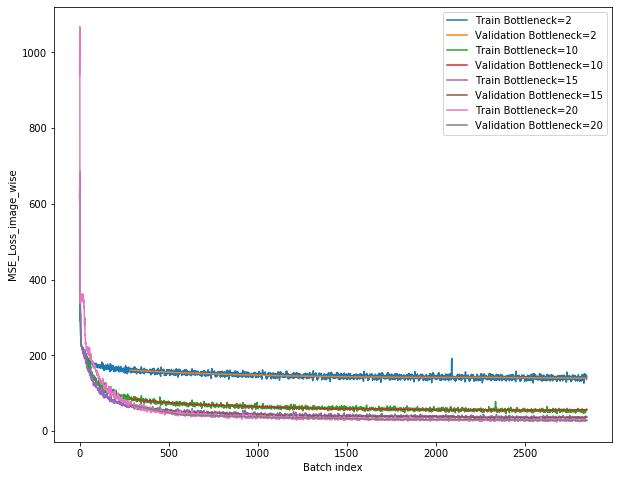

In [0]:
plt.figure(figsize=(10, 8))
for pos in range(0,len(bottleneck_array)):
    plt.xlabel('Batch index')
    plt.ylabel('MSE_Loss_image_wise')
    plt.plot(range(0, len(train_loader)*hparams['num_epochs']), tr_losses_array[pos], label='Train Bottleneck='+str(bottleneck_array[pos]))
    plt.plot(range(len(train_loader), (hparams['num_epochs']+1)*len(train_loader), len(train_loader)), val_losses_array[pos], label='Validation Bottleneck='+str(bottleneck_array[pos]))
    plt.legend()

4. Compute the avg. image reconstruction error (MSE) of the trained models on the MNIST validation and test sets. Show the results in a table, including #params of each model.

In [0]:
def model_params(model):
  """ 
  Function that sum the number of parameters of a network.
  
  Parameters: 
      model (network): The chosen network.
    
  Returns: 
      pp: Number of parameters of a network.
  """
  pp=0
  for p in list(model.parameters()):
      nn=1
      for s in list(p.size()):
          nn = nn*s
      pp += nn 
  return pp

In [0]:
#VALIDATION MSE_error

validation_error=[]
for i in range(0,len(network_array)):
  validation_error.append(val_epoch(validation_loader, network_array[i], hparams,plot_boolean=False))

#TEST MSE_error

test_error=[]
for i in range(0,len(network_array)):
  test_error.append(val_epoch(test_loader, network_array[i], hparams,plot_boolean=False))

#NUMBER OF PARAMETERS
number_param=[]
for i in range(0,len(network_array)):
  number_param.append(model_params(network_array[i]))


header=['Bootleneck Size','Validation error','Test error', 'Number of parameters']  
data=np.array([bottleneck_array,validation_error,test_error,number_param])

print(tabulate(data.transpose(),header))

  Bootleneck Size    Validation error    Test error    Number of parameters
-----------------  ------------------  ------------  ----------------------
                2            139.462       138.707                   101623
               10             56.0881       55.0728                  140831
               15             36.6327       35.7806                  165336
               20             28.2183       27.4763                  189841


5. Select one of the autoencoders and feed it 5 random MNIST images from the test set. Show them along with their reconstructions.

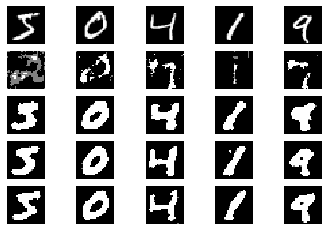

In [0]:
N=5
images=train_set.data[0:N]
image=images.view(N,1,28,28)

images_out_set=[]

dtype_t = torch.cuda.FloatTensor
for i in range(0,len(network_array)):
  images_out_set.append(network_array[i](image.cpu().type(dtype_t)).view(-1,28,28).cpu().int())

f,matrix=plt.subplots(len(bottleneck_array)+1, N)

for i in range(0,len(bottleneck_array)+1):
  for j in range(0,N):
    if i==0:
      matrix[i,j].imshow(images[j],cmap='gray')
    else:
      matrix[i,j].imshow(images_out_set[i-1][j],cmap='gray')
    matrix[i,j].axis('off')

6. Generate 5 new images by injecting random values as input to the decoder. Show them.

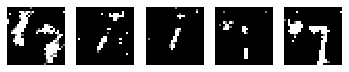

In [0]:
N=5
pos=0
device=hparams['device']
random_input=torch.randn(N,bottleneck_array[pos])*255
random_input=random_input.to(device)

images_art=network_array[pos].decoder(random_input)
images_art=images_art.view(-1,28,28)
images_art=images_art.cpu().int()

f,array=plt.subplots(1, N)

for j in range(0,N):
  array[j].imshow(images_art[j],cmap='gray')
  array[j].axis('off')

# **Exercise 2. Transfer Learning**

Steps:
1. Select a subset of 100 images and their associated labels from the MNIST training data.


In [0]:
N=100
list_images = list(range(0, N))

trainset_class = torch.utils.data.Subset(train_set, list_images)

trainloader_class = torch.utils.data.DataLoader(trainset_class, batch_size=10, shuffle=True)

print("Num of samples: ", len(trainloader_class.dataset))

Num of samples:  100


2. Select one of the previously trained autoencoders.

3. Create a digit (0-9) classification model reusing the encoder of the autoencoder and adding the needed fully connected (projection) layer.

In [0]:
num_classes = 10
hparams['num_epochs']=20

class ClassifierMNIST(nn.Module):
  """ 
  This is a class for defining a Classifier network based on an encoder and a linear layer.
    
  Attributes: 
      bottleneck (int): number of features at the output of the encoder and the input of the decoder.
      encoder (Encoder): Initialization of the used encoder.
  """
  def __init__(self, bottleneck, encoder):
    """ 
    The constructor for ClassifierMNIST class. An encoder, a projection, funcion activation ReLU and Softmax are defined here.

    Parameters: 
      bottleneck (int): number of features at the output of the encoder and the input of the decoder.
      encoder (Encoder): Initialization of the used encoder.
    """
    super().__init__()
    self.encoder = encoder
    self.lin=nn.Linear(bottleneck, num_classes)
    self.relu = nn.ReLU()
    self.softmax = nn.Softmax(dim=1)


  def forward(self,x):
    """
    Function that generates the following network is:
    Encoder-->Linear-->Softmax

    Parameters:
      x (tensor): Input image.

    Returns: A label which each component will be between 0 and 1 value.
    """
    x = self.encoder(x)
    x = self.lin(x)
    y = self.softmax(x)
    return y

In [0]:
#Training function definitions

def correct_predictions(predicted_batch, label_batch):
  """ 
  Function that computes the sum the correct predicted labels in a batch.
  
  Parameters: 
    predicted_batch (Tensor): Labels are given by an image that passthrough a trained network.
    label_batch (Tensor): Labels that are the target.

  Returns: 
    acum: Number of correct predictions.
  """
  pred = predicted_batch.argmax(dim=1, keepdim=True) 
  acum = pred.eq(label_batch.view_as(pred)).sum().item()
  return acum

def train_class_epoch(train_loader, network, optimizer, criterion, hparams):
  """ 
  Function where the network is trained according to the kind of optimzer and criterion.
  Losses are from labels.
  
  Parameters: 
      train_loader (DataLoader): Training dataset whose purpose is teaching to a network.
      network (Autoencoder): The chosen network.
      optimizer (RMSprop): The type of the optimizer.
      criterion (NLLLoss): Loss function that is used.
      hparams (dict): Hyperparameters for defining training parameters.
    
  Returns: 
      train_losses: List of losses. Each component is the mean of image loss by each batch.
  """
  network.train()
  device = hparams['device']
  train_losses = []

  for batch_idx, (data, target) in enumerate(train_loader):
      data, target = data.to(device), target.to(device)
      optimizer.zero_grad()
      output = network(data)
      loss = criterion(output, target)
      loss.backward()
      train_losses.append(loss.item())
      optimizer.step()
      if batch_idx % hparams['log_interval'] == 0:
          print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
              epoch, batch_idx * len(data), len(train_loader.dataset),
              100. * batch_idx / len(train_loader), loss.item()))
  return train_losses

def val_class_epoch(validation_loader, network, criterion, hparams, type_set):
  """ 
  Function where the network is computing a validation of the trained network.
  
  Parameters: 
      validation_loader (DataLoader): Validation dataset whose purpose is making a confirmation on how the well-trained network is.
      network (Autoencoder): The chosen trained network.
      criterion (NLLLoss): Loss function that is used.
      hparams (dict): Hyperparameters for defining validation parameters.
      type_set (bool): What type of printing:
        * True: Validation phase metrics.
        * False: Testing phase metrics.
    
  Returns: 
      val_loss: Average loss from validation/testing dataset.
      val_acc: Average accuracy from validation/testing dataset.
  """
  # if type_set = True --> validation phase
  # if type_set = False --> testing phase
  network.eval()
  
  device = hparams['device']
  val_loss = 0
  acc = 0
  with torch.no_grad():
      for batch_idx, (data, target) in enumerate(validation_loader):
          data, target = data.to(device), target.to(device)
          output = network(data)
          val_loss += criterion(output, target).item()        
          acc += correct_predictions(output, target)

  # Average accuracy across all correct predictions batches
  val_loss /= len(validation_loader)
  val_acc = 100. * acc / len(validation_loader.dataset)

  if type_set:
    print('Validation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        val_loss, acc, len(validation_loader.dataset), val_acc,
        ))
  else:
    print('Testing set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        val_loss, acc, len(validation_loader.dataset), val_acc,
        ))
  return val_loss, val_acc

4. Pre-training: use the weights of the autoencoders as initial values for the network weights and train a classification model on the subset of 100 samples.

5. Fine-tuning: do the same, but train the new projection layer with a normal learning rate and the reused part with a very low learning rate.

6. From scratch: train a model on the 100 samples without reusing the decoder weights at all.

In [0]:
pos=1
encoder_net1 = copy.deepcopy(network_array[pos].encoder)
encoder_net2 = copy.deepcopy(network_array[pos].encoder)
bottleneck=bottleneck_array[pos]
criterion_class=nn.NLLLoss()

# Pre-trained metrics
tr_losses_pt = []
val_losses_pt = []
val_accs_pt = []
test_losses_pt = []
test_accs_pt = []

# Pre-training
print("Pre-training:")
print("-------------")
network1=ClassifierMNIST(bottleneck, encoder_net1)
network1.to(hparams['device'])
optimizer1 = optim.RMSprop([
                            {'params':network1.lin.parameters()},
                            {'params':network1.encoder.parameters(), 'lr':0}],
                           lr=hparams['learning_rate'])


for epoch in range(1, hparams['num_epochs'] + 1):
  # Training phase
  tr_losses_pt.append(train_class_epoch(trainloader_class, network1, optimizer1, criterion_class, hparams))
  # Validation phase
  val_loss_class, acc_val = val_class_epoch(validation_loader, network1, criterion_class, hparams, type_set=True)
  val_losses_pt.append(val_loss_class)
  val_accs_pt.append(acc_val)
  # Testing phase
  test_loss_class, acc_test = val_class_epoch(test_loader, network1, criterion_class, hparams, type_set=False)
  test_losses_pt.append(test_loss_class)
  test_accs_pt.append(acc_test)
  
tr_loss_pt_flat = [item     for sublist in tr_losses_pt     for item in sublist]

In [0]:
# Fine-tuning metrics
tr_losses_ft = []
val_losses_ft = []
val_accs_ft = []
test_losses_ft = []
test_accs_ft = []

# Fine-tuning
print("Fine-tuning:")
print("------------")
network2=ClassifierMNIST(bottleneck, encoder_net2)
network2.to(hparams['device'])
optimizer2 = optim.RMSprop([
                            {'params':network2.lin.parameters()},
                            {'params':network2.encoder.parameters(), 'lr':hparams['learning_rate_small']}],
                           lr=hparams['learning_rate'])

for epoch in range(1, hparams['num_epochs'] + 1):
  # Training phase
  tr_losses_ft.append(train_class_epoch(trainloader_class, network2, optimizer2, criterion_class, hparams))
  # Validation phase
  val_loss_class, acc_val = val_class_epoch(validation_loader, network2, criterion_class, hparams, type_set=True)
  val_losses_ft.append(val_loss_class)
  val_accs_ft.append(acc_val)
  # Testing phase
  test_loss_class, acc_test = val_class_epoch(test_loader, network2, criterion_class, hparams, type_set=False)
  test_losses_ft.append(test_loss_class)
  test_accs_ft.append(acc_test)

tr_loss_ft_flat = [item     for sublist in tr_losses_ft     for item in sublist]

In [0]:
# From Scratch metrics
tr_losses_fs = []
val_losses_fs = []
val_accs_fs = []
test_losses_fs = []
test_accs_fs = []

# From Scratch
print("From-scratch:")
print("-------------")
network3=ClassifierMNIST(bottleneck, Encoder(bottleneck))
network3.to(hparams['device'])
optimizer3 = optim.RMSprop(network3.parameters(), lr=hparams['learning_rate'])


for epoch in range(1, hparams['num_epochs'] + 1):
  # Training phase
  tr_losses_fs.append(train_class_epoch(trainloader_class, network3, optimizer3, criterion_class, hparams))
  # Validation phase
  val_loss_class, acc_val = val_class_epoch(validation_loader, network3, criterion_class, hparams, type_set=True)
  val_losses_fs.append(val_loss_class)
  val_accs_fs.append(acc_val)
  # Testing phase
  test_loss_class, acc_test = val_class_epoch(test_loader, network3, criterion_class, hparams, type_set=False)
  test_losses_fs.append(test_loss_class)
  test_accs_fs.append(acc_test)

tr_loss_fs_flat = [item     for sublist in tr_losses_fs     for item in sublist]

Plot the loss curves (Train and Validation) for the 3 models above

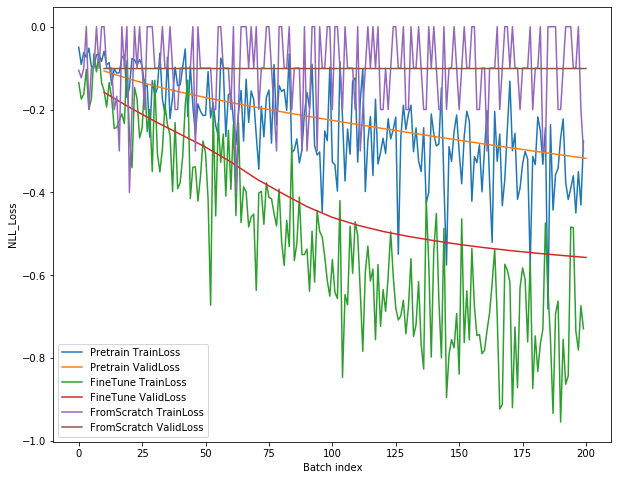

In [0]:
plt.figure(figsize=(10, 8))
plt.xlabel('Batch index')
plt.ylabel('NLL_Loss')
plt.plot(range(0, len(trainloader_class)*hparams['num_epochs']), tr_loss_pt_flat, label='Pretrain TrainLoss')
plt.plot(range(len(trainloader_class), (hparams['num_epochs']+1)*len(trainloader_class), len(trainloader_class)), val_losses_pt, label='Pretrain ValidLoss')
plt.plot(range(0, len(trainloader_class)*hparams['num_epochs']), tr_loss_ft_flat, label='FineTune TrainLoss')
plt.plot(range(len(trainloader_class), (hparams['num_epochs']+1)*len(trainloader_class), len(trainloader_class)), val_losses_ft, label='FineTune ValidLoss')
plt.plot(range(0, len(trainloader_class)*hparams['num_epochs']), tr_loss_fs_flat, label='FromScratch TrainLoss')
plt.plot(range(len(trainloader_class), (hparams['num_epochs']+1)*len(trainloader_class), len(trainloader_class)), val_losses_fs, label='FromScratch ValidLoss')
plt.legend()

7. Show the accuracy of the three models on the MNIST test set in a table.

In [0]:
models = np.array(["Pre-trained", "Fine-tuned", "From-scratch"])
test_accuracies = np.array([test_accs_pt[-1], 
                            test_accs_ft[-1], 
                            test_accs_fs[-1]])

header=['Model', 'Accuracy']
data=np.array([models,test_accuracies])

print(tabulate(data.transpose(),header))

Model           Accuracy
------------  ----------
Pre-trained        42.52
Fine-tuned         60.47
From-scratch       10.28


# **Exercise 3. Variational Autoencoder**

Steps:

1. Implement an autoencoder like that from Exercise 1, but turning the deterministic bottleneck into a stochastic bottleneck, with an isotropic Gaussian as distribution for the latent variables.

2. Train the model optimizing the Evidence Lower Bound (ELBO).

3. Generate samples with the decoder and show them.

In [0]:
class Encoder_double(nn.Module):
  """ 
  This is a class for defining an Encoder network.
    
  Attributes: 
      bottleneck (int): number of features at the output of the encoder.
  """
  def __init__(self, bottleneck):
    """ 
    The constructor for Encoder class. The two convolution layers of an encoder, a flatten, and linear layer are defined here.
    
    For convolution layers we use ConvBlock class, and all needed parameters are given by hparams_architecture. 
    Linear layer for its input definition takes into account the image size, whose value in this case is 28x28, 
    and the number of filters from the output of convolutional layers. For its outputs size, is selected by double value of bottleneck parameter.

    Parameters: 
        bottleneck (int): number of features at the output of the encoder. Its double value will be the output size of the network.
    """
    super().__init__()

    self.conv1 = ConvBlock(1, 
                           hparams_architecture['num_filters_l1'], 
                           hparams_architecture['kernel_size_l1']
                           )
    
    self.conv2 = ConvBlock(hparams_architecture['num_filters_l1'], 
                           hparams_architecture['num_filters_l2'], 
                           hparams_architecture['kernel_size_l2']
                           )
    
    self.flat=nn.Flatten()

    self.lin=nn.Linear(in_features=((int(28/(hparams_architecture['stride']**2))**2)*hparams_architecture['num_filters_l2']),
                       out_features=2*bottleneck)

  def forward(self,x):
    """ 
    The function defines the network: 
    
    Conv2D-->ReLU-->MaxPooling-->Conv2D-->ReLU-->MaxPooling-->Linear

    Parameters: 
        x (Tensor): Input image.
      
    Returns: 
        Encoder_double: The chosen network.
    """
    x=self.conv1(x)
    x=self.conv2(x)
    x=self.flat(x)
    y=self.lin(x)
    y=y.view(-1,2,bottleneck)    
    return y

class VAE(nn.Module):
  """ 
  This is a class for defining a Variational Autoencoder network. An autoencoder with a latent sampled representation between Encoder and Decoder.
  The expected weights in encoder network are for a mean and standard deviation computation.
    
  Attributes: 
      bottleneck (int): number of features at the output of the encoder and the input of the decoder.
  """
  def __init__(self,bottleneck):
    """ 
    The constructor for VAE class. Encoder and Decoder objects are declared here.

    Parameters: 
        bottleneck (int): number of features at the output of the encoder at the input of the decoder.
    """
    super().__init__()
    self.encoder = Encoder_double(bottleneck)
    self.decoder = Decoder(bottleneck)

  def forward(self,x):
    """ 
    The function defines the network: 
    
    Encoder-->latent sampled representation-->Decoder

    Parameters: 
        x (Tensor): Input image.
      
    Returns: 
        VAE: The chosen network.
    """
    values=self.encoder(x)
    means=values[:,0,:]
    log_sigmas=values[:,1,:] #To be sure that sigma is positive.
    z=torch.exp(log_sigmas)*torch.randn(means.size(dim=1),dtype=means.dtype,device=means.device)+means
    y=self.decoder(z)
    return y,log_sigmas,means

In [0]:
#Loss function.
class loss_class:
  """ 
  This is a class for defining losses computed by reconstruction and Kulback-Leibler divergence.
  This will be used for a losses criterion.
  """
  def __init__(self):
    super().__init__()

  def loss_function(data,data_out,means,log_sigmas):
    """ 
    The function computes Kulback-Leibler divergence, then losses using MSE function and finally total losses according according to calculations done before.
    
    Parameters: 
        data (Tensor): Expected image.
        data_out (Tensor): Image at the output of the network (e.g. VAE).
        means (Tensor): Means from encoder output.
        log_sigmas (Tensor): Log standard deviation from an encoder output.
      
    Returns: 
        total_loss: Losses calculated 
    """
    #Two components of the loss: reconstruction+KL divergence.
    #KL divergence can be computed using the means and variances (because we are assuming
    #that all the distributions are normal). (see appendix B of Auto-Encoding Variational Bayer; Kingma)
    DKL=-1/2*torch.sum(1+2*log_sigmas-means**2-torch.exp(2*log_sigmas)) 
    reconstruction_loss=F.mse_loss(data,data_out,reduction='sum')

    total_loss=reconstruction_loss+DKL
    return total_loss

In [0]:
def train_epoch(train_loader, network, optimizer, criterion, hparams):
  # Activate the train=True flag inside the model
  network.train()
  device = hparams['device']
  avg_loss = []

  for batch_idx, (data,target) in enumerate(train_loader):
      data = data.to(device)      
      optimizer.zero_grad()
      output, log_sigmas, means = network(data)
      loss = criterion(data,output,means,log_sigmas)
      loss.backward()
      avg_loss.append(loss.item()/hparams['batch_size'])
      optimizer.step()
      if batch_idx % hparams['log_interval'] == 0:
          print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
              epoch, batch_idx * len(data), len(train_loader.dataset),
              100. * batch_idx / len(train_loader), loss.item()/hparams['batch_size']))
  return avg_loss

def val_epoch(validation_loader, network, hparams, plot_boolean):
    network.eval()
    device = hparams['device']
    validation_loss = 0

    with torch.no_grad():
        for batch_idx, (data,target) in enumerate(validation_loader):
            data = data.to(device)
            output, log_sigmas, means = network(data)
            validation_loss += criterion(data,output,means,log_sigmas).item()/hparams['batch_size'] # sum up batch loss

    # Average loss across all correct predictions batches now
    validation_loss /= len(validation_loader)
    if plot_boolean:
      print('\n Validation set: Average loss: {:.4f} \n'.format(validation_loss))
    return validation_loss

In [0]:
tr_losses = []
val_losses = []

bottleneck=10
network=VAE(bottleneck)
network.to(hparams['device'])
optimizer = optim.Adam(network.parameters(), lr=hparams['learning_rate'])
criterion = loss_class.loss_function

for epoch in range(1, hparams['num_epochs'] + 1):
    # Trainig phase
    tr_losses.append(train_epoch(train_loader, network, optimizer, criterion, hparams))
    # Validation phase
    val_loss = val_epoch(validation_loader, network, hparams,True)
    val_losses.append(val_loss)

tr_loss_flat = [item     for sublist in tr_losses     for item in sublist]
plt.figure(figsize=(10, 8))

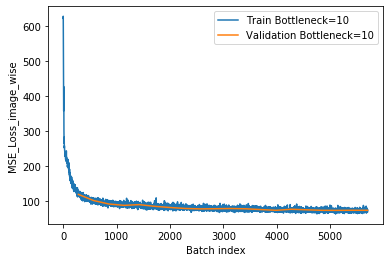

In [0]:
plt.xlabel('Batch index')
plt.ylabel('MSE_Loss_image_wise')
plt.plot(range(0, len(train_loader)*hparams['num_epochs']), tr_loss_flat, label='Train Bottleneck='+str(bottleneck))
plt.plot(range(len(train_loader), (hparams['num_epochs']+1)*len(train_loader), len(train_loader)), val_losses, label='Validation Bottleneck='+str(bottleneck))
plt.legend()

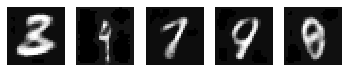

In [0]:
#3. Generate samples with the decoder and show them.

N=5 #Number of samples
device=hparams['device']
z=torch.randn(N,bottleneck).to(device)

images_art=network.decoder(z)
images_art=images_art.view(-1,28,28)*10
images_art=images_art.cpu().int()

f,array=plt.subplots(1, N)

for j in range(0,N):
  array[j].imshow(images_art[j],cmap='gray')
  array[j].axis('off')

# **Exercise 4. Conditional GAN**

Steps:

1. Implement a generator and discriminator based on deconvolutions and convolutions respectively.

2. Train the GAN on MNIST.

3. Generate samples with the generator and show them.

In [0]:
# Hyper-Parameters

hparams={
    'batch_size': 128,
    'learning_rate': 1e-4,
    'train_epoch': 20,
    'kernel_size':4,
    'padding':0,
    'stride':1,
    'input_size':100,
    'num_epochs':20
}

hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'
device = hparams['device']


In [0]:
# DATA LOADING
img_size = 32

train_set_gan=datasets.MNIST('data',train=True,transform=transforms.Compose([transforms.Resize(img_size, interpolation=0),transforms.ToTensor(),transforms.Normalize((0.5,),(0.5,))]),download=True)
train_loader_gan = torch.utils.data.DataLoader(train_set_gan, batch_size=hparams['batch_size'])

In [0]:
class generator(nn.Module):
  
  def __init__(self):
    super().__init__()

    self.lin=nn.Linear(hparams['input_size']+1,1024*hparams['kernel_size']**2) #We add +1 for the label.
    
    self.deconv1 =nn.Sequential(
      nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=4, stride=2, padding=1,bias=False),
      nn.BatchNorm2d(512),
      nn.ReLU())
    
    self.deconv2 =nn.Sequential(
      nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1,bias=False),
      nn.BatchNorm2d(256),
      nn.ReLU())
    
    self.deconv3 = nn.Sequential(
      nn.ConvTranspose2d(in_channels=256, out_channels=1, kernel_size=4, stride=2,padding= 1,bias=False),
      nn.Tanh())


  def forward(self, input, label):
    x = torch.cat([input, label],dim=1)
    x = self.lin(x).view(-1,1024,hparams['kernel_size'],hparams['kernel_size'])
    x = self.deconv1(x)
    x = self.deconv2(x)
    x = self.deconv3(x)
    return x


  def weight_initialization(self, mean, std):
    for module in self._modules:
      normal_init(self._modules[module], mean, std)   

class discriminator(nn.Module):

  def __init__(self):
    super().__init__()

    #Instead of using a convolution with the label (because it has a size of batch x 1) I add a linear
    #layer in order to map to the same dimensionality that has the image.

    self.fc_label=nn.Linear(1,32**2) #image size

    self.conv1 = nn.Sequential(
      nn.Conv2d(in_channels=2, out_channels=128, kernel_size=4, stride=2, padding=1,bias=False),
      nn.LeakyReLU(0.2,inplace=True))

    self.conv2 =nn.Sequential(
      nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1,bias=False),
      nn.BatchNorm2d(256),
      nn.LeakyReLU(0.2,inplace=True))
      
    self.conv3 = nn.Sequential(
      nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1,bias=False),
      nn.BatchNorm2d(512),
      nn.LeakyReLU(0.2,inplace=True))

    self.sigmoid = nn.Sigmoid()
    self.fc=nn.Linear(4*4*512,1) #We have to compute the Size.

  # weightn initialization
  def weight_initialization(self, mean, std):
    for module in self._modules:
      normal_init(self._modules[module], mean, std)
  
  def forward(self, input, label):
    label_out=self.fc_label(label).view(-1,1,32,32)
    x = torch.cat([input, label_out],dim=1)
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = x.view(-1,4*4*512)
    x = self.sigmoid(self.fc(x))
    return x

def normal_init(m, mean, std):
  if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
    m.weight.data.normal_(mean, std)
    m.bias.data.zero_()


In [0]:
def display_batch_images(img, imtype=np.uint8, unnormalize=True, nrows=None, mean=0.5, std=0.5):
    # select a sample or create grid if img is a batch
    if len(img.shape) == 4:
        nrows = nrows if nrows is not None else int(math.sqrt(img.size(0)))
        img = utils.make_grid(img, nrow=nrows)

    # unnormalize
    img = img.cpu().float()
    img = (img*std+mean)*255

    # to numpy
    image_numpy = img.detach().numpy()
    image_numpy = np.transpose(image_numpy, (1, 2, 0))
    display(Image.fromarray(image_numpy.astype(imtype)))     

In [0]:
#TRAINING OF THE DISCRIMINATOR, used later in the training

def training_discriminator_step(data,number_label,generator,discriminator,optimizer,criterion):

  optimizer.zero_grad()

  batch=data.size()[0]
  label_real= torch.ones(batch)
  label_fake = torch.zeros(batch)
  label_real, label_fake = Variable(label_real).to(hparams['device']), Variable(label_fake).to(hparams['device']) 

  #Loss associated with the real images.
  output_discriminator=discriminator(data,number_label)
  loss_real=criterion(torch.squeeze(output_discriminator),label_real)


  dtype=torch.cuda.FloatTensor
  #Loss associated with the fake images.
  fake_images=generator(torch.randn(batch,hparams['input_size']).type(dtype),number_label)
  output_discriminator=discriminator(fake_images,number_label)
  loss_fake=criterion(torch.squeeze(output_discriminator),label_fake)

  loss=(loss_real+loss_fake)/2
  loss.backward()

  optimizer.step()

  return loss.item()


#TRAINING OF THE GENERATOR
def training_generator_step(data,number_label,generator,discriminator,optimizer,criterion):
  
  optimizer.zero_grad()

  batch=data.size()[0]
  label_real = torch.ones(batch)
  label_real= Variable(label_real).to(hparams['device'])



  dtype=torch.cuda.FloatTensor
  #We generate fake samples and test them in the discriminator.
  fake_images=generator(torch.randn(batch,hparams['input_size']).type(dtype),number_label)
  output_discriminator=discriminator(fake_images,number_label)
  loss=criterion(torch.squeeze(output_discriminator),label_real)
ipynb
  loss.backward()
  optimizer.step()

  return loss.item()


# TRAINING FUNCTION
def train_epoch_net(generator,discriminator,optimizer_D, optimizer_G,criterion, train_loader_gan):
  D_losses = []
  G_losses = []

  for batch_ind,(data,number_label) in enumerate(train_loader_gan):

    data=data.to(hparams['device'])
    number_label=number_label.type(torch.cuda.FloatTensor).view(data.size()[0],1)



    M=torch.tensor([0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,3,3,3,3,3,3,3,3,3,4,4,4,4,4,4,4,4,4,5,5,5,5,5,5,5,5,5,6,6,6,6,6,6,6,6,6,7,7,7,7,7,7,7,7,7,8,8,8,8,8,8,8,8,8,9,9,9,9,9,9,9,9,9])
    #TRAIN DISCRIMINATOR
    D_losses.append(training_discriminator_step(data,number_label,generator,discriminator,optimizer_D,criterion))

    # TRAIN GENERATOR
    G_losses.append(training_generator_step(data,number_label,generator,discriminator,optimizer_G,criterion))


    # Show current loss
    if (batch_ind) % 10 == 0:
      print( f"batch: {batch_ind}/{len(train_loader_gan)}, G_loss: {G_losses[batch_ind]}, D_loss: {D_losses[batch_ind]}") 

    # Show fake samples
    dtype=torch.cuda.FloatTensor
    if (batch_ind) % 100 == 0:
      fake_images = generator(torch.randn(len(M),hparams['input_size']).type(dtype),M.type(torch.cuda.FloatTensor).view(-1,1))
      display_batch_images(fake_images)
  return D_losses, G_losses



batch: 0/469, G_loss: 3.420316696166992, D_loss: 0.7068830132484436


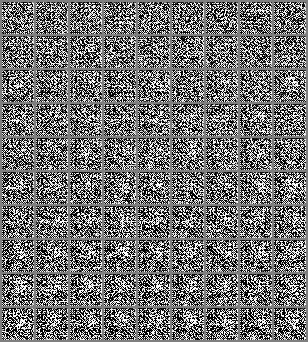

batch: 10/469, G_loss: 1.9306631088256836, D_loss: 0.6340218782424927
batch: 20/469, G_loss: 2.2152795791625977, D_loss: 0.41558974981307983
batch: 30/469, G_loss: 1.4012525081634521, D_loss: 0.42735934257507324
batch: 40/469, G_loss: 0.8010059595108032, D_loss: 0.6039068698883057
batch: 50/469, G_loss: 1.0543792247772217, D_loss: 0.6017100811004639
batch: 60/469, G_loss: 2.8621883392333984, D_loss: 0.5385672450065613
batch: 70/469, G_loss: 1.3822035789489746, D_loss: 0.3950410485267639
batch: 80/469, G_loss: 2.947465181350708, D_loss: 0.1951020061969757
batch: 90/469, G_loss: 4.018229007720947, D_loss: 0.7278839349746704
batch: 100/469, G_loss: 2.199162721633911, D_loss: 0.15557320415973663


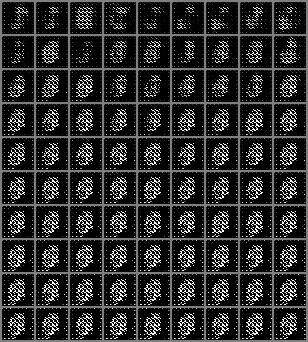

batch: 110/469, G_loss: 2.0496888160705566, D_loss: 0.2892274558544159
batch: 120/469, G_loss: 2.925776481628418, D_loss: 0.10818866640329361
batch: 130/469, G_loss: 2.8869917392730713, D_loss: 0.14443601667881012
batch: 140/469, G_loss: 2.370062828063965, D_loss: 0.14329098165035248
batch: 150/469, G_loss: 3.225412607192993, D_loss: 0.14127255976200104
batch: 160/469, G_loss: 1.3861110210418701, D_loss: 0.4461876153945923
batch: 170/469, G_loss: 3.3276829719543457, D_loss: 0.32435348629951477
batch: 180/469, G_loss: 2.8117899894714355, D_loss: 0.1367669552564621
batch: 190/469, G_loss: 3.2114620208740234, D_loss: 0.10250246524810791
batch: 200/469, G_loss: 6.757462978363037, D_loss: 0.8884954452514648


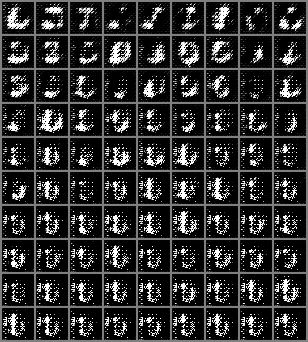

batch: 210/469, G_loss: 2.1153204441070557, D_loss: 0.7788840532302856
batch: 220/469, G_loss: 1.3479201793670654, D_loss: 0.5707569122314453
batch: 230/469, G_loss: 0.996959924697876, D_loss: 0.517450213432312
batch: 240/469, G_loss: 0.9968138933181763, D_loss: 0.6824933886528015
batch: 250/469, G_loss: 1.857276439666748, D_loss: 0.4849435091018677
batch: 260/469, G_loss: 1.7156985998153687, D_loss: 0.4042205810546875
batch: 270/469, G_loss: 1.0223873853683472, D_loss: 0.453158438205719
batch: 280/469, G_loss: 2.2566959857940674, D_loss: 0.6373540759086609
batch: 290/469, G_loss: 2.3765721321105957, D_loss: 0.531474232673645
batch: 300/469, G_loss: 1.3984179496765137, D_loss: 0.496999055147171


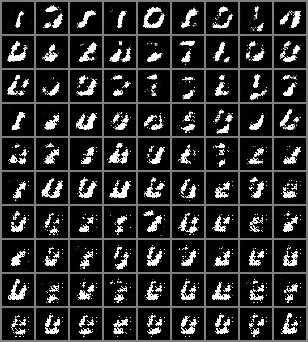

batch: 310/469, G_loss: 1.5055477619171143, D_loss: 0.44437432289123535
batch: 320/469, G_loss: 0.7205928564071655, D_loss: 0.6430354118347168
batch: 330/469, G_loss: 1.2218490839004517, D_loss: 0.5393816232681274
batch: 340/469, G_loss: 1.7487672567367554, D_loss: 0.30800020694732666
batch: 350/469, G_loss: 2.2657923698425293, D_loss: 0.6780895590782166
batch: 360/469, G_loss: 0.722480833530426, D_loss: 0.6683933734893799
batch: 370/469, G_loss: 1.1007963418960571, D_loss: 0.6355897784233093
batch: 380/469, G_loss: 1.6473736763000488, D_loss: 0.44693320989608765
batch: 390/469, G_loss: 1.959218978881836, D_loss: 0.44916296005249023
batch: 400/469, G_loss: 1.1119228601455688, D_loss: 0.5872277021408081


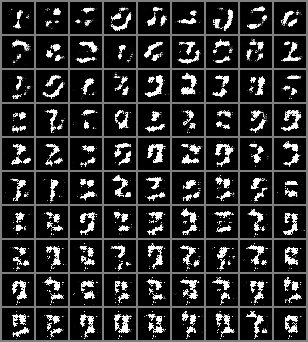

batch: 410/469, G_loss: 0.5335018634796143, D_loss: 0.6450729370117188
batch: 420/469, G_loss: 1.4665030241012573, D_loss: 0.5422653555870056
batch: 430/469, G_loss: 1.6759047508239746, D_loss: 0.38350629806518555
batch: 440/469, G_loss: 1.7722946405410767, D_loss: 0.5247406363487244
batch: 450/469, G_loss: 1.0859161615371704, D_loss: 0.5348750352859497
batch: 460/469, G_loss: 1.900360345840454, D_loss: 0.5101826786994934
Epoch: 1 Time:  65.71785163879395
batch: 0/469, G_loss: 1.847663402557373, D_loss: 0.6138159036636353


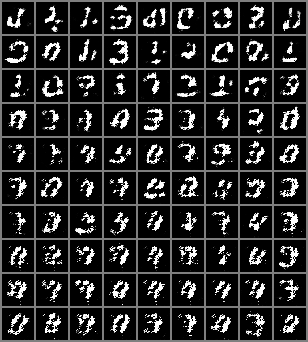

batch: 10/469, G_loss: 1.985424280166626, D_loss: 0.5941262245178223
batch: 20/469, G_loss: 0.9715490341186523, D_loss: 0.5661103129386902
batch: 30/469, G_loss: 2.143606185913086, D_loss: 0.4736449122428894
batch: 40/469, G_loss: 0.8608445525169373, D_loss: 0.5939987301826477
batch: 50/469, G_loss: 1.6348035335540771, D_loss: 0.5292386412620544
batch: 60/469, G_loss: 0.9920676350593567, D_loss: 0.5650622844696045
batch: 70/469, G_loss: 1.4462285041809082, D_loss: 0.43490058183670044
batch: 80/469, G_loss: 1.4565287828445435, D_loss: 0.5022505521774292
batch: 90/469, G_loss: 1.9279699325561523, D_loss: 0.4723201394081116
batch: 100/469, G_loss: 1.5576257705688477, D_loss: 0.5020321011543274


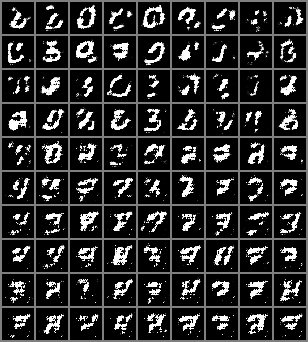

batch: 110/469, G_loss: 1.7170741558074951, D_loss: 0.6337674260139465
batch: 120/469, G_loss: 1.0923811197280884, D_loss: 0.49684011936187744
batch: 130/469, G_loss: 0.7303105592727661, D_loss: 0.5797874331474304
batch: 140/469, G_loss: 1.70284104347229, D_loss: 0.4362717568874359
batch: 150/469, G_loss: 1.2486019134521484, D_loss: 0.44464778900146484
batch: 160/469, G_loss: 1.7757327556610107, D_loss: 0.42905858159065247
batch: 170/469, G_loss: 1.665499210357666, D_loss: 0.4892331063747406
batch: 180/469, G_loss: 0.9164988398551941, D_loss: 0.5313414335250854
batch: 190/469, G_loss: 1.65362548828125, D_loss: 0.6188956499099731
batch: 200/469, G_loss: 2.0242764949798584, D_loss: 0.44370150566101074


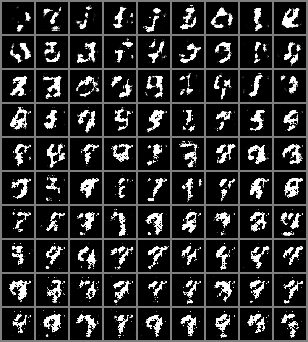

batch: 210/469, G_loss: 1.8977549076080322, D_loss: 0.5844196081161499
batch: 220/469, G_loss: 1.3234230279922485, D_loss: 0.41119545698165894
batch: 230/469, G_loss: 1.190818428993225, D_loss: 0.44692057371139526
batch: 240/469, G_loss: 1.05410897731781, D_loss: 0.4810694456100464
batch: 250/469, G_loss: 1.2960021495819092, D_loss: 0.5094566941261292
batch: 260/469, G_loss: 1.7328107357025146, D_loss: 0.5232417583465576
batch: 270/469, G_loss: 1.9247856140136719, D_loss: 0.5060508251190186
batch: 280/469, G_loss: 1.696573257446289, D_loss: 0.487346887588501
batch: 290/469, G_loss: 1.0920802354812622, D_loss: 0.4982476532459259
batch: 300/469, G_loss: 2.091843605041504, D_loss: 0.41978147625923157


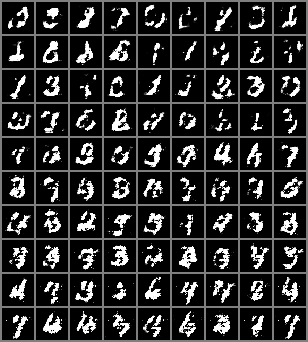

batch: 310/469, G_loss: 1.5800210237503052, D_loss: 0.41758909821510315
batch: 320/469, G_loss: 1.339504599571228, D_loss: 0.5023720860481262
batch: 330/469, G_loss: 1.6155441999435425, D_loss: 0.4520641267299652
batch: 340/469, G_loss: 0.8170289993286133, D_loss: 0.472856342792511
batch: 350/469, G_loss: 2.139066457748413, D_loss: 0.50232994556427
batch: 360/469, G_loss: 1.1357510089874268, D_loss: 0.5217405557632446
batch: 370/469, G_loss: 2.028372287750244, D_loss: 0.5898396968841553
batch: 380/469, G_loss: 1.7362250089645386, D_loss: 0.3845791220664978
batch: 390/469, G_loss: 1.0445520877838135, D_loss: 0.5278030633926392
batch: 400/469, G_loss: 2.2360024452209473, D_loss: 0.5439450740814209


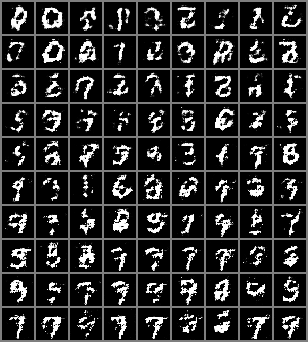

batch: 410/469, G_loss: 1.4580276012420654, D_loss: 0.4086928367614746
batch: 420/469, G_loss: 2.539055824279785, D_loss: 0.5758660435676575
batch: 430/469, G_loss: 2.250250816345215, D_loss: 0.43970900774002075
batch: 440/469, G_loss: 1.9480431079864502, D_loss: 0.48943281173706055
batch: 450/469, G_loss: 2.2108941078186035, D_loss: 0.6029118895530701
batch: 460/469, G_loss: 1.4967679977416992, D_loss: 0.4236079752445221
Epoch: 2 Time:  66.25908637046814
batch: 0/469, G_loss: 1.9580153226852417, D_loss: 0.7090434432029724


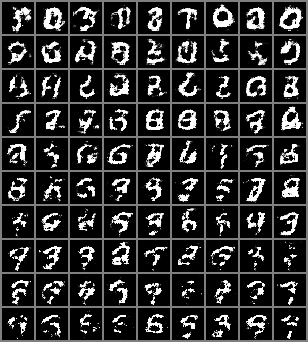

batch: 10/469, G_loss: 1.5439172983169556, D_loss: 0.5266674757003784
batch: 20/469, G_loss: 1.8783481121063232, D_loss: 0.4168054461479187
batch: 30/469, G_loss: 1.9117851257324219, D_loss: 0.5543115139007568
batch: 40/469, G_loss: 1.374303936958313, D_loss: 0.4413648545742035
batch: 50/469, G_loss: 1.6019494533538818, D_loss: 0.48423099517822266
batch: 60/469, G_loss: 1.7931314706802368, D_loss: 0.5112510323524475
batch: 70/469, G_loss: 1.275558352470398, D_loss: 0.4553833603858948
batch: 80/469, G_loss: 1.3957570791244507, D_loss: 0.6372122764587402
batch: 90/469, G_loss: 2.09371280670166, D_loss: 0.6597121357917786
batch: 100/469, G_loss: 1.766343116760254, D_loss: 0.49001333117485046


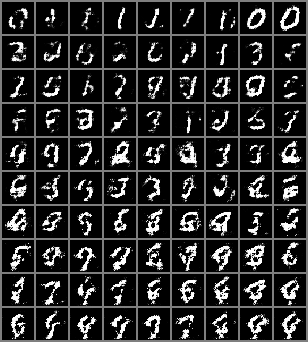

batch: 110/469, G_loss: 1.9405442476272583, D_loss: 0.5056931972503662
batch: 120/469, G_loss: 0.7478216886520386, D_loss: 0.6530019044876099
batch: 130/469, G_loss: 2.301071882247925, D_loss: 0.5310673713684082
batch: 140/469, G_loss: 0.9256001710891724, D_loss: 0.5229498147964478
batch: 150/469, G_loss: 1.4402694702148438, D_loss: 0.48052120208740234
batch: 160/469, G_loss: 1.1021478176116943, D_loss: 0.5560763478279114
batch: 170/469, G_loss: 2.191347360610962, D_loss: 0.7630608677864075
batch: 180/469, G_loss: 1.014967918395996, D_loss: 0.4951501786708832
batch: 190/469, G_loss: 1.4678597450256348, D_loss: 0.4338962435722351
batch: 200/469, G_loss: 1.649408221244812, D_loss: 0.46729913353919983


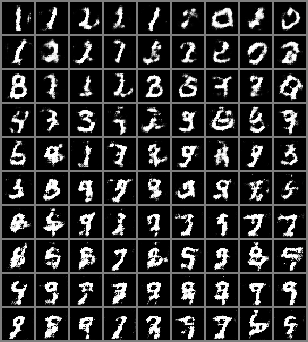

batch: 210/469, G_loss: 1.5937350988388062, D_loss: 0.45107942819595337
batch: 220/469, G_loss: 0.8207771182060242, D_loss: 0.4654811918735504
batch: 230/469, G_loss: 1.4884743690490723, D_loss: 0.491829514503479
batch: 240/469, G_loss: 0.6511965990066528, D_loss: 0.6553316712379456
batch: 250/469, G_loss: 1.4806748628616333, D_loss: 0.5078005194664001
batch: 260/469, G_loss: 2.008171796798706, D_loss: 0.44967883825302124
batch: 270/469, G_loss: 1.781960368156433, D_loss: 0.4835572838783264
batch: 280/469, G_loss: 1.534052848815918, D_loss: 0.4958323836326599
batch: 290/469, G_loss: 2.3773458003997803, D_loss: 0.5749689936637878
batch: 300/469, G_loss: 2.019787073135376, D_loss: 0.537746250629425


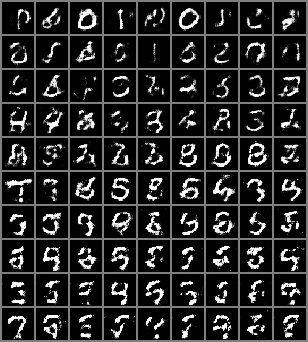

batch: 310/469, G_loss: 1.2170119285583496, D_loss: 0.6139633655548096
batch: 320/469, G_loss: 1.001031756401062, D_loss: 0.5180346965789795
batch: 330/469, G_loss: 1.2706681489944458, D_loss: 0.41476497054100037
batch: 340/469, G_loss: 1.3359512090682983, D_loss: 0.4467344880104065
batch: 350/469, G_loss: 0.7898188233375549, D_loss: 0.5406454205513
batch: 360/469, G_loss: 1.2429349422454834, D_loss: 0.5062272548675537
batch: 370/469, G_loss: 1.8678416013717651, D_loss: 0.518552303314209
batch: 380/469, G_loss: 1.5322149991989136, D_loss: 0.4214465320110321
batch: 390/469, G_loss: 1.7698440551757812, D_loss: 0.6212588548660278
batch: 400/469, G_loss: 1.8556421995162964, D_loss: 0.7514901161193848


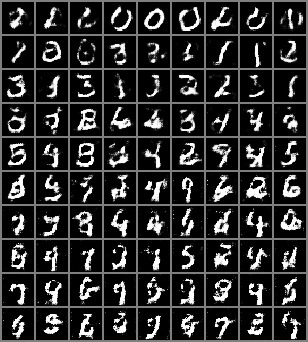

batch: 410/469, G_loss: 1.0381187200546265, D_loss: 0.47668585181236267
batch: 420/469, G_loss: 1.277462124824524, D_loss: 0.4774828851222992
batch: 430/469, G_loss: 1.7633941173553467, D_loss: 0.621008038520813
batch: 440/469, G_loss: 1.378640055656433, D_loss: 0.5078420639038086
batch: 450/469, G_loss: 2.0641889572143555, D_loss: 0.651016354560852
batch: 460/469, G_loss: 1.499953269958496, D_loss: 0.3590806722640991
Epoch: 3 Time:  66.33634662628174
batch: 0/469, G_loss: 1.6100763082504272, D_loss: 0.6552709937095642


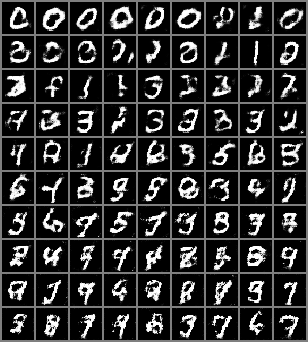

batch: 10/469, G_loss: 1.3276824951171875, D_loss: 0.48236575722694397
batch: 20/469, G_loss: 1.6334096193313599, D_loss: 0.4429498016834259
batch: 30/469, G_loss: 1.5100067853927612, D_loss: 0.46949538588523865
batch: 40/469, G_loss: 1.3410682678222656, D_loss: 0.5007104873657227
batch: 50/469, G_loss: 1.4613170623779297, D_loss: 0.42332369089126587
batch: 60/469, G_loss: 0.7556851506233215, D_loss: 0.6993671655654907
batch: 70/469, G_loss: 1.0707521438598633, D_loss: 0.4598388075828552
batch: 80/469, G_loss: 1.3476923704147339, D_loss: 0.5287767648696899
batch: 90/469, G_loss: 0.6817730665206909, D_loss: 0.5544999241828918
batch: 100/469, G_loss: 1.098974585533142, D_loss: 0.42129403352737427


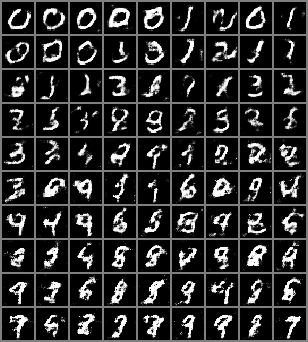

batch: 110/469, G_loss: 1.2402079105377197, D_loss: 0.49090391397476196
batch: 120/469, G_loss: 1.004384160041809, D_loss: 0.4805057644844055
batch: 130/469, G_loss: 2.096007823944092, D_loss: 0.48716652393341064
batch: 140/469, G_loss: 1.3085200786590576, D_loss: 0.4613141417503357
batch: 150/469, G_loss: 0.9746090173721313, D_loss: 0.5219994187355042
batch: 160/469, G_loss: 0.8366082310676575, D_loss: 0.49011552333831787
batch: 170/469, G_loss: 1.7397006750106812, D_loss: 0.46630537509918213
batch: 180/469, G_loss: 0.8395857214927673, D_loss: 0.5339580178260803
batch: 190/469, G_loss: 1.575303554534912, D_loss: 0.4606313407421112
batch: 200/469, G_loss: 1.8118557929992676, D_loss: 0.4158364534378052


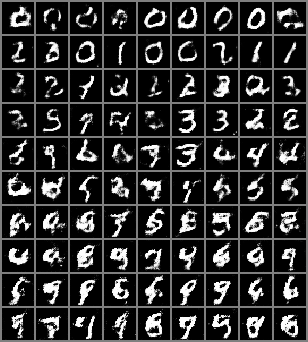

batch: 210/469, G_loss: 1.5131992101669312, D_loss: 0.408099502325058
batch: 220/469, G_loss: 0.9345176219940186, D_loss: 0.531702995300293
batch: 230/469, G_loss: 1.5508967638015747, D_loss: 0.4798782467842102
batch: 240/469, G_loss: 1.0705015659332275, D_loss: 0.6096509695053101
batch: 250/469, G_loss: 1.3909837007522583, D_loss: 0.611011803150177
batch: 260/469, G_loss: 1.247912049293518, D_loss: 0.448558509349823
batch: 270/469, G_loss: 1.5081422328948975, D_loss: 0.46040859818458557
batch: 280/469, G_loss: 1.331484317779541, D_loss: 0.4594241976737976
batch: 290/469, G_loss: 1.336503028869629, D_loss: 0.4455941617488861
batch: 300/469, G_loss: 2.037459373474121, D_loss: 0.5386161208152771


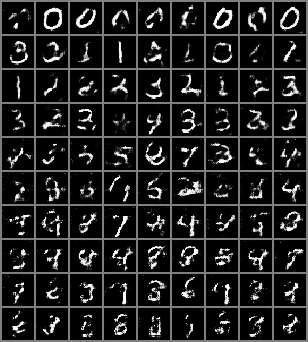

batch: 310/469, G_loss: 0.7385757565498352, D_loss: 0.551792323589325
batch: 320/469, G_loss: 1.0443115234375, D_loss: 0.49659112095832825
batch: 330/469, G_loss: 1.605938196182251, D_loss: 0.48484423756599426
batch: 340/469, G_loss: 1.3373892307281494, D_loss: 0.48891669511795044
batch: 350/469, G_loss: 0.9654077887535095, D_loss: 0.5204663872718811
batch: 360/469, G_loss: 1.492712140083313, D_loss: 0.4660135507583618
batch: 370/469, G_loss: 0.920257568359375, D_loss: 0.4368855357170105
batch: 380/469, G_loss: 1.691758632659912, D_loss: 0.5166192054748535
batch: 390/469, G_loss: 0.7188853621482849, D_loss: 0.5568499565124512
batch: 400/469, G_loss: 1.705849528312683, D_loss: 0.6936335563659668


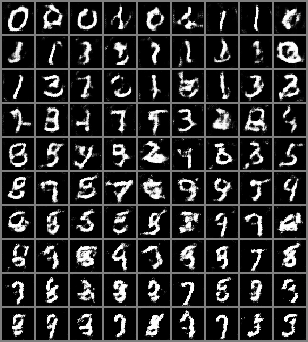

batch: 410/469, G_loss: 0.8835198283195496, D_loss: 0.5743282437324524
batch: 420/469, G_loss: 1.6643702983856201, D_loss: 0.40774205327033997
batch: 430/469, G_loss: 1.8060227632522583, D_loss: 0.531427800655365
batch: 440/469, G_loss: 1.2187204360961914, D_loss: 0.49616774916648865
batch: 450/469, G_loss: 2.205530881881714, D_loss: 0.5813245177268982
batch: 460/469, G_loss: 2.1571385860443115, D_loss: 0.3825482130050659
Epoch: 4 Time:  66.40980124473572
batch: 0/469, G_loss: 1.463122844696045, D_loss: 0.5087176561355591


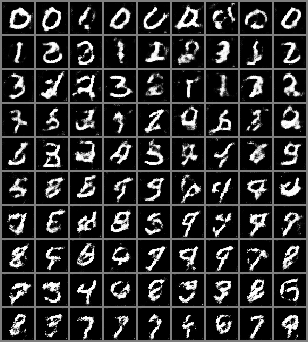

batch: 10/469, G_loss: 0.6447784900665283, D_loss: 0.64559006690979
batch: 20/469, G_loss: 1.9530534744262695, D_loss: 0.4327307641506195
batch: 30/469, G_loss: 1.2496333122253418, D_loss: 0.40419161319732666
batch: 40/469, G_loss: 1.1536288261413574, D_loss: 0.5068128705024719
batch: 50/469, G_loss: 1.4638397693634033, D_loss: 0.4243620038032532
batch: 60/469, G_loss: 1.025661587715149, D_loss: 0.5544494986534119
batch: 70/469, G_loss: 1.2802283763885498, D_loss: 0.3975590467453003
batch: 80/469, G_loss: 1.5771328210830688, D_loss: 0.46248361468315125
batch: 90/469, G_loss: 1.2151217460632324, D_loss: 0.5260762572288513
batch: 100/469, G_loss: 1.0142557621002197, D_loss: 0.475654274225235


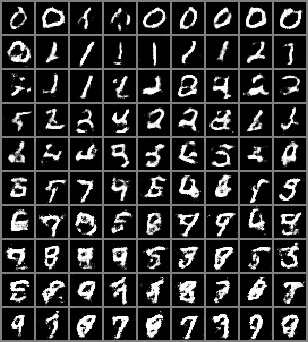

batch: 110/469, G_loss: 1.6197402477264404, D_loss: 0.4719286561012268
batch: 120/469, G_loss: 0.7792421579360962, D_loss: 0.4645531177520752
batch: 130/469, G_loss: 1.7883715629577637, D_loss: 0.3817988932132721
batch: 140/469, G_loss: 1.1512014865875244, D_loss: 0.4975452721118927
batch: 150/469, G_loss: 1.2160425186157227, D_loss: 0.45574951171875
batch: 160/469, G_loss: 0.6850588321685791, D_loss: 0.46226567029953003
batch: 170/469, G_loss: 1.057237148284912, D_loss: 0.467032253742218
batch: 180/469, G_loss: 0.8802462816238403, D_loss: 0.46771660447120667
batch: 190/469, G_loss: 1.6221842765808105, D_loss: 0.4930586814880371
batch: 200/469, G_loss: 1.4733630418777466, D_loss: 0.40881267189979553


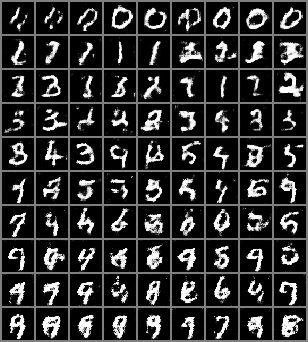

batch: 210/469, G_loss: 2.0058999061584473, D_loss: 0.43310728669166565
batch: 220/469, G_loss: 0.7842063903808594, D_loss: 0.5717716813087463
batch: 230/469, G_loss: 1.816380500793457, D_loss: 0.5454404950141907
batch: 240/469, G_loss: 2.5764522552490234, D_loss: 0.6723179817199707
batch: 250/469, G_loss: 0.805203914642334, D_loss: 0.4632267951965332
batch: 260/469, G_loss: 1.5698411464691162, D_loss: 0.4483375549316406
batch: 270/469, G_loss: 1.511030673980713, D_loss: 0.4840020537376404
batch: 280/469, G_loss: 1.0874183177947998, D_loss: 0.5293295383453369
batch: 290/469, G_loss: 1.6720104217529297, D_loss: 0.4789137840270996
batch: 300/469, G_loss: 1.5575377941131592, D_loss: 0.5468819737434387


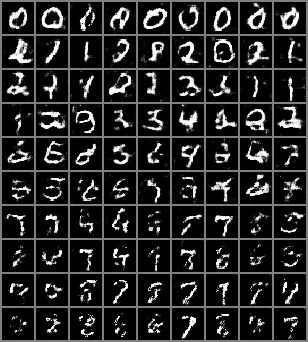

batch: 310/469, G_loss: 1.5239042043685913, D_loss: 0.4928235113620758
batch: 320/469, G_loss: 1.0148468017578125, D_loss: 0.4949760138988495
batch: 330/469, G_loss: 0.9608504772186279, D_loss: 0.4513179361820221
batch: 340/469, G_loss: 1.795841932296753, D_loss: 0.5410124063491821
batch: 350/469, G_loss: 0.9323217868804932, D_loss: 0.538097620010376
batch: 360/469, G_loss: 1.2779912948608398, D_loss: 0.5076874494552612
batch: 370/469, G_loss: 1.7223848104476929, D_loss: 0.5626439452171326
batch: 380/469, G_loss: 2.1306138038635254, D_loss: 0.5827990770339966
batch: 390/469, G_loss: 1.159777283668518, D_loss: 0.46876299381256104
batch: 400/469, G_loss: 1.8682639598846436, D_loss: 0.6409893035888672


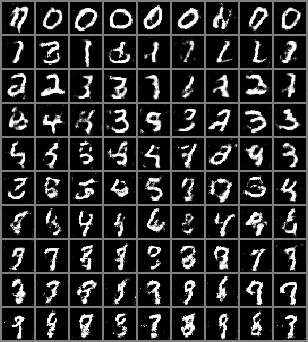

batch: 410/469, G_loss: 0.9231104254722595, D_loss: 0.568148672580719
batch: 420/469, G_loss: 2.1096060276031494, D_loss: 0.46276432275772095
batch: 430/469, G_loss: 1.9117481708526611, D_loss: 0.5450762510299683
batch: 440/469, G_loss: 0.9041916131973267, D_loss: 0.5012337565422058
batch: 450/469, G_loss: 1.781658411026001, D_loss: 0.5050503015518188
batch: 460/469, G_loss: 1.4946279525756836, D_loss: 0.3955361247062683
Epoch: 5 Time:  66.35485792160034
batch: 0/469, G_loss: 1.3364924192428589, D_loss: 0.5698554515838623


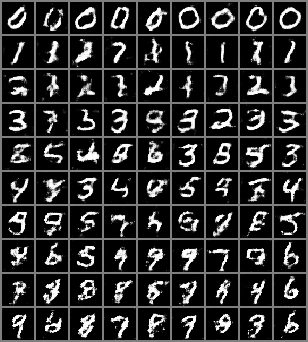

batch: 10/469, G_loss: 0.46411630511283875, D_loss: 0.7344513535499573
batch: 20/469, G_loss: 1.8210647106170654, D_loss: 0.47469109296798706
batch: 30/469, G_loss: 1.1125123500823975, D_loss: 0.49281787872314453
batch: 40/469, G_loss: 1.3876041173934937, D_loss: 0.520434558391571
batch: 50/469, G_loss: 1.6160190105438232, D_loss: 0.4479331076145172
batch: 60/469, G_loss: 1.0411205291748047, D_loss: 0.6031339168548584
batch: 70/469, G_loss: 1.5855671167373657, D_loss: 0.4140578806400299
batch: 80/469, G_loss: 1.2883777618408203, D_loss: 0.47592735290527344
batch: 90/469, G_loss: 1.6639759540557861, D_loss: 0.5749120712280273
batch: 100/469, G_loss: 1.1298108100891113, D_loss: 0.4893339276313782


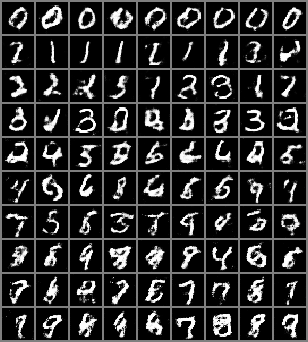

batch: 110/469, G_loss: 1.160355806350708, D_loss: 0.5164400339126587
batch: 120/469, G_loss: 0.9497593641281128, D_loss: 0.48442113399505615
batch: 130/469, G_loss: 2.2617619037628174, D_loss: 0.474336713552475
batch: 140/469, G_loss: 0.8710613250732422, D_loss: 0.48689448833465576
batch: 150/469, G_loss: 0.8842172026634216, D_loss: 0.5138195753097534
batch: 160/469, G_loss: 1.333345651626587, D_loss: 0.490426629781723
batch: 170/469, G_loss: 1.04735267162323, D_loss: 0.4857972264289856
batch: 180/469, G_loss: 1.1385160684585571, D_loss: 0.5066192746162415
batch: 190/469, G_loss: 1.2408391237258911, D_loss: 0.49010658264160156
batch: 200/469, G_loss: 1.161726951599121, D_loss: 0.3857872486114502


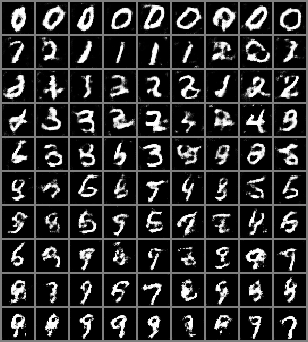

batch: 210/469, G_loss: 2.2587645053863525, D_loss: 0.5513182878494263
batch: 220/469, G_loss: 0.6933168172836304, D_loss: 0.6323080062866211
batch: 230/469, G_loss: 1.7202214002609253, D_loss: 0.611254870891571
batch: 240/469, G_loss: 1.7124207019805908, D_loss: 0.5390497446060181
batch: 250/469, G_loss: 0.6981855630874634, D_loss: 0.5684661865234375
batch: 260/469, G_loss: 1.2594517469406128, D_loss: 0.45900532603263855
batch: 270/469, G_loss: 1.3538846969604492, D_loss: 0.49178069829940796
batch: 280/469, G_loss: 1.7766821384429932, D_loss: 0.5044904351234436
batch: 290/469, G_loss: 2.187464714050293, D_loss: 0.6182004809379578
batch: 300/469, G_loss: 1.203671932220459, D_loss: 0.5105761289596558


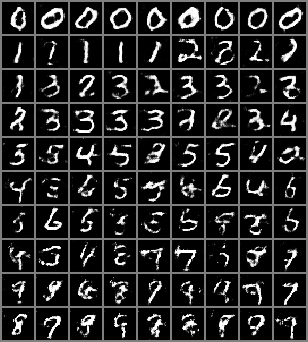

batch: 310/469, G_loss: 1.4901267290115356, D_loss: 0.5380134582519531
batch: 320/469, G_loss: 1.0268733501434326, D_loss: 0.5552783012390137
batch: 330/469, G_loss: 1.2460217475891113, D_loss: 0.5031158924102783
batch: 340/469, G_loss: 1.5928013324737549, D_loss: 0.5229865312576294
batch: 350/469, G_loss: 1.146348237991333, D_loss: 0.519708514213562
batch: 360/469, G_loss: 1.0509103536605835, D_loss: 0.4455365240573883
batch: 370/469, G_loss: 1.25752854347229, D_loss: 0.5394101142883301
batch: 380/469, G_loss: 1.5647611618041992, D_loss: 0.5966768264770508
batch: 390/469, G_loss: 1.6572834253311157, D_loss: 0.5842069387435913
batch: 400/469, G_loss: 1.6547012329101562, D_loss: 0.5449172258377075


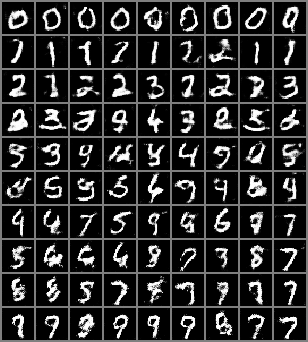

batch: 410/469, G_loss: 0.8859215974807739, D_loss: 0.5908830761909485
batch: 420/469, G_loss: 2.2161495685577393, D_loss: 0.5955966114997864
batch: 430/469, G_loss: 1.4354997873306274, D_loss: 0.447287380695343
batch: 440/469, G_loss: 1.943660020828247, D_loss: 0.6217145919799805
batch: 450/469, G_loss: 1.3746709823608398, D_loss: 0.5197480916976929
batch: 460/469, G_loss: 0.9205764532089233, D_loss: 0.4863371253013611
Epoch: 6 Time:  66.2847011089325
batch: 0/469, G_loss: 1.0227112770080566, D_loss: 0.5386155247688293


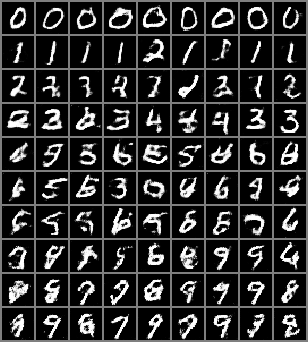

batch: 10/469, G_loss: 0.7155203819274902, D_loss: 0.5974156856536865
batch: 20/469, G_loss: 1.4541733264923096, D_loss: 0.4928555488586426
batch: 30/469, G_loss: 1.1262649297714233, D_loss: 0.4751383066177368
batch: 40/469, G_loss: 0.8403800129890442, D_loss: 0.5707526803016663
batch: 50/469, G_loss: 0.8802887201309204, D_loss: 0.5404086709022522
batch: 60/469, G_loss: 0.9667596220970154, D_loss: 0.5507726669311523
batch: 70/469, G_loss: 1.3557281494140625, D_loss: 0.44595134258270264
batch: 80/469, G_loss: 1.286679983139038, D_loss: 0.4561946392059326
batch: 90/469, G_loss: 1.0119354724884033, D_loss: 0.49334508180618286
batch: 100/469, G_loss: 1.2466521263122559, D_loss: 0.47418248653411865


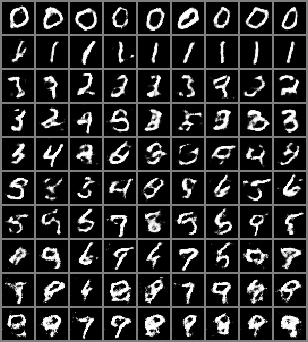

batch: 110/469, G_loss: 1.7380411624908447, D_loss: 0.5562803745269775
batch: 120/469, G_loss: 0.7446863651275635, D_loss: 0.5448463559150696
batch: 130/469, G_loss: 1.9154462814331055, D_loss: 0.512365460395813
batch: 140/469, G_loss: 0.8304464817047119, D_loss: 0.537346601486206
batch: 150/469, G_loss: 0.7899518013000488, D_loss: 0.4985561966896057
batch: 160/469, G_loss: 1.4055869579315186, D_loss: 0.4451133608818054
batch: 170/469, G_loss: 0.8241440653800964, D_loss: 0.549872100353241
batch: 180/469, G_loss: 1.2277926206588745, D_loss: 0.5516903400421143
batch: 190/469, G_loss: 1.3061339855194092, D_loss: 0.4153450131416321
batch: 200/469, G_loss: 1.3312510251998901, D_loss: 0.4287901520729065


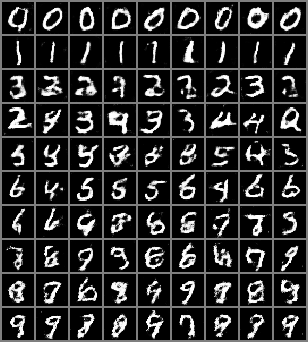

batch: 210/469, G_loss: 2.123533248901367, D_loss: 0.5228011012077332
batch: 220/469, G_loss: 0.9751821756362915, D_loss: 0.5510658025741577
batch: 230/469, G_loss: 1.9562034606933594, D_loss: 0.6421125531196594
batch: 240/469, G_loss: 2.0835084915161133, D_loss: 0.6705265045166016
batch: 250/469, G_loss: 0.6158657670021057, D_loss: 0.5717152953147888
batch: 260/469, G_loss: 1.6080652475357056, D_loss: 0.46429386734962463
batch: 270/469, G_loss: 0.8331009745597839, D_loss: 0.5088651180267334
batch: 280/469, G_loss: 1.96116042137146, D_loss: 0.4737115204334259
batch: 290/469, G_loss: 1.806675910949707, D_loss: 0.4677082896232605
batch: 300/469, G_loss: 1.2798964977264404, D_loss: 0.4616682529449463


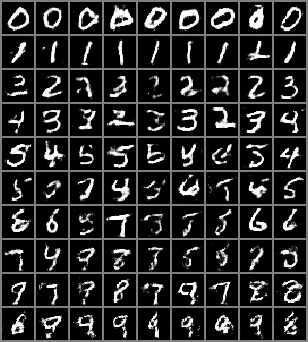

batch: 310/469, G_loss: 1.5143117904663086, D_loss: 0.5556247234344482
batch: 320/469, G_loss: 0.7414767146110535, D_loss: 0.505056619644165
batch: 330/469, G_loss: 0.8336145877838135, D_loss: 0.4749702215194702
batch: 340/469, G_loss: 1.5752716064453125, D_loss: 0.4490218758583069
batch: 350/469, G_loss: 1.4408398866653442, D_loss: 0.5247194766998291
batch: 360/469, G_loss: 1.586287021636963, D_loss: 0.5547844171524048
batch: 370/469, G_loss: 1.032027006149292, D_loss: 0.5221630930900574
batch: 380/469, G_loss: 2.1693649291992188, D_loss: 0.5941668748855591
batch: 390/469, G_loss: 1.3635239601135254, D_loss: 0.4883781671524048
batch: 400/469, G_loss: 1.4406042098999023, D_loss: 0.5318490266799927


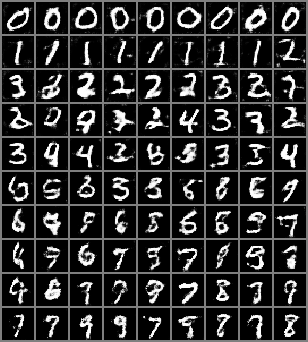

batch: 410/469, G_loss: 0.9297765493392944, D_loss: 0.5763476490974426
batch: 420/469, G_loss: 2.3950698375701904, D_loss: 0.5502389073371887
batch: 430/469, G_loss: 2.020531415939331, D_loss: 0.5208572149276733
batch: 440/469, G_loss: 1.1793832778930664, D_loss: 0.48121675848960876
batch: 450/469, G_loss: 0.9139968156814575, D_loss: 0.49400290846824646
batch: 460/469, G_loss: 1.719879150390625, D_loss: 0.4510350227355957
Epoch: 7 Time:  66.35268998146057
batch: 0/469, G_loss: 1.2015619277954102, D_loss: 0.6212642788887024


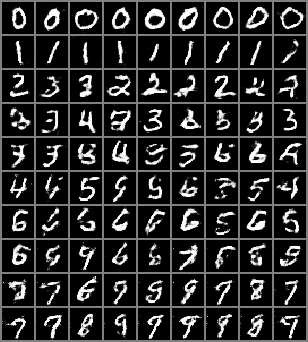

batch: 10/469, G_loss: 0.6610910892486572, D_loss: 0.6477941274642944
batch: 20/469, G_loss: 1.2441859245300293, D_loss: 0.42926502227783203
batch: 30/469, G_loss: 1.3610851764678955, D_loss: 0.5104649066925049
batch: 40/469, G_loss: 0.8542125225067139, D_loss: 0.5024727582931519
batch: 50/469, G_loss: 1.6847424507141113, D_loss: 0.47548407316207886
batch: 60/469, G_loss: 1.3010389804840088, D_loss: 0.47426658868789673
batch: 70/469, G_loss: 1.1979148387908936, D_loss: 0.46546757221221924
batch: 80/469, G_loss: 1.3207051753997803, D_loss: 0.5439642071723938
batch: 90/469, G_loss: 1.1599736213684082, D_loss: 0.5043345093727112
batch: 100/469, G_loss: 1.0478599071502686, D_loss: 0.4559084177017212


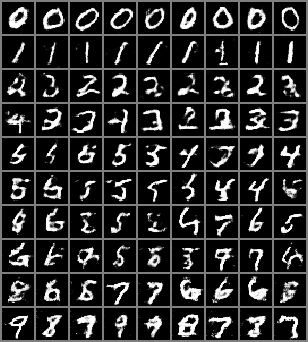

batch: 110/469, G_loss: 1.534372091293335, D_loss: 0.4892677664756775
batch: 120/469, G_loss: 1.2106976509094238, D_loss: 0.46961596608161926
batch: 130/469, G_loss: 2.370138645172119, D_loss: 0.519267201423645
batch: 140/469, G_loss: 0.9008796215057373, D_loss: 0.514453649520874
batch: 150/469, G_loss: 0.9686238765716553, D_loss: 0.5841518640518188
batch: 160/469, G_loss: 0.9733895659446716, D_loss: 0.4209890365600586
batch: 170/469, G_loss: 1.1006929874420166, D_loss: 0.47122877836227417
batch: 180/469, G_loss: 1.2665115594863892, D_loss: 0.5100069046020508
batch: 190/469, G_loss: 1.2316231727600098, D_loss: 0.49417516589164734
batch: 200/469, G_loss: 1.3369650840759277, D_loss: 0.482057124376297


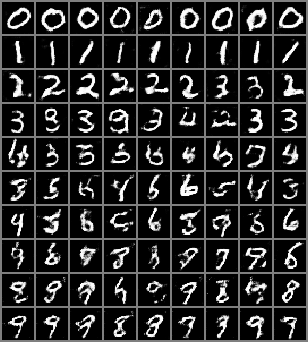

batch: 210/469, G_loss: 1.8551957607269287, D_loss: 0.6024502515792847
batch: 220/469, G_loss: 0.8597406148910522, D_loss: 0.4872896075248718
batch: 230/469, G_loss: 1.4606283903121948, D_loss: 0.5734354257583618
batch: 240/469, G_loss: 1.7324855327606201, D_loss: 0.5118610858917236
batch: 250/469, G_loss: 0.9656015038490295, D_loss: 0.5833089351654053
batch: 260/469, G_loss: 1.9483731985092163, D_loss: 0.5649634599685669
batch: 270/469, G_loss: 0.7874305248260498, D_loss: 0.6294317245483398
batch: 280/469, G_loss: 1.8880422115325928, D_loss: 0.5428211688995361
batch: 290/469, G_loss: 2.1401031017303467, D_loss: 0.49789756536483765
batch: 300/469, G_loss: 1.6093170642852783, D_loss: 0.5340375900268555


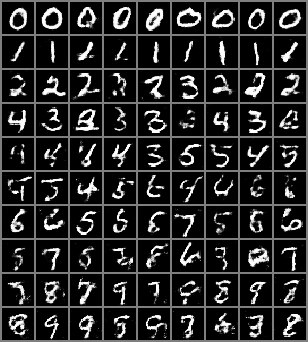

batch: 310/469, G_loss: 1.3207985162734985, D_loss: 0.5222979784011841
batch: 320/469, G_loss: 0.6464298367500305, D_loss: 0.5500629544258118
batch: 330/469, G_loss: 0.8802238702774048, D_loss: 0.5600486397743225
batch: 340/469, G_loss: 1.7349481582641602, D_loss: 0.510915994644165
batch: 350/469, G_loss: 0.7235996723175049, D_loss: 0.5655548572540283
batch: 360/469, G_loss: 1.2179441452026367, D_loss: 0.47988975048065186
batch: 370/469, G_loss: 1.3280255794525146, D_loss: 0.5429064631462097
batch: 380/469, G_loss: 1.6719497442245483, D_loss: 0.5659902095794678
batch: 390/469, G_loss: 1.298142910003662, D_loss: 0.47471529245376587
batch: 400/469, G_loss: 1.487640619277954, D_loss: 0.5830528736114502


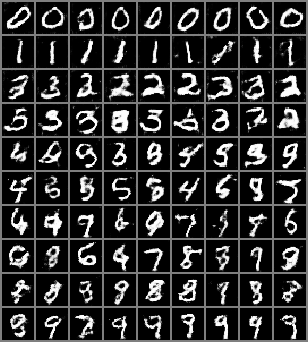

batch: 410/469, G_loss: 0.8186215162277222, D_loss: 0.5044118165969849
batch: 420/469, G_loss: 1.86933434009552, D_loss: 0.4533669948577881
batch: 430/469, G_loss: 2.1113436222076416, D_loss: 0.6552864909172058
batch: 440/469, G_loss: 1.0528525114059448, D_loss: 0.4768354594707489
batch: 450/469, G_loss: 0.7706013321876526, D_loss: 0.5477532148361206
batch: 460/469, G_loss: 1.0958186388015747, D_loss: 0.45785224437713623
Epoch: 8 Time:  66.61151814460754
batch: 0/469, G_loss: 0.7968572974205017, D_loss: 0.5746841430664062


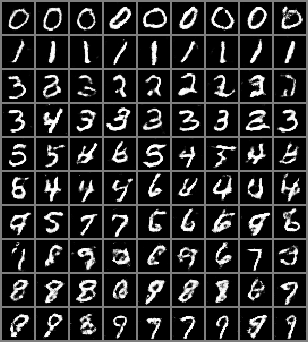

batch: 10/469, G_loss: 1.2501150369644165, D_loss: 0.5475330352783203
batch: 20/469, G_loss: 1.081145167350769, D_loss: 0.5192174911499023
batch: 30/469, G_loss: 1.6417925357818604, D_loss: 0.48833805322647095
batch: 40/469, G_loss: 1.3334904909133911, D_loss: 0.5599788427352905
batch: 50/469, G_loss: 1.9220426082611084, D_loss: 0.5139071941375732
batch: 60/469, G_loss: 1.3698614835739136, D_loss: 0.5113634467124939
batch: 70/469, G_loss: 1.3709781169891357, D_loss: 0.5140358209609985
batch: 80/469, G_loss: 1.0094245672225952, D_loss: 0.5280976891517639
batch: 90/469, G_loss: 1.2856525182724, D_loss: 0.499784916639328
batch: 100/469, G_loss: 1.2354769706726074, D_loss: 0.5234946012496948


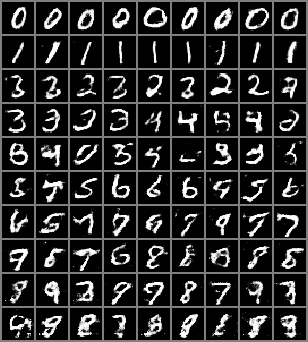

batch: 110/469, G_loss: 1.5470468997955322, D_loss: 0.5407717823982239
batch: 120/469, G_loss: 1.5723891258239746, D_loss: 0.4979877471923828
batch: 130/469, G_loss: 1.7437916994094849, D_loss: 0.5933655500411987
batch: 140/469, G_loss: 1.101248860359192, D_loss: 0.4861728250980377
batch: 150/469, G_loss: 1.2723135948181152, D_loss: 0.45820608735084534
batch: 160/469, G_loss: 1.328986644744873, D_loss: 0.4665449261665344
batch: 170/469, G_loss: 0.5633955001831055, D_loss: 0.573277473449707
batch: 180/469, G_loss: 1.127787709236145, D_loss: 0.4935508370399475
batch: 190/469, G_loss: 1.1594442129135132, D_loss: 0.48310452699661255
batch: 200/469, G_loss: 1.6174427270889282, D_loss: 0.46550634503364563


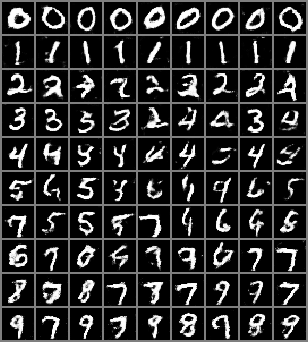

batch: 210/469, G_loss: 1.842494010925293, D_loss: 0.5340684652328491
batch: 220/469, G_loss: 0.7665461897850037, D_loss: 0.5646265149116516
batch: 230/469, G_loss: 1.4310598373413086, D_loss: 0.5853199362754822
batch: 240/469, G_loss: 1.9611787796020508, D_loss: 0.5778471827507019
batch: 250/469, G_loss: 0.7075338959693909, D_loss: 0.6183223128318787
batch: 260/469, G_loss: 1.1249743700027466, D_loss: 0.484115868806839
batch: 270/469, G_loss: 0.9238272905349731, D_loss: 0.5818493366241455
batch: 280/469, G_loss: 1.9585025310516357, D_loss: 0.4479100704193115
batch: 290/469, G_loss: 1.8668131828308105, D_loss: 0.4567086696624756
batch: 300/469, G_loss: 1.2479552030563354, D_loss: 0.5201743841171265


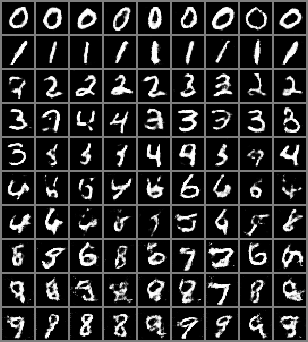

batch: 310/469, G_loss: 1.475694179534912, D_loss: 0.6500110626220703
batch: 320/469, G_loss: 1.0736902952194214, D_loss: 0.4957851469516754
batch: 330/469, G_loss: 0.863377571105957, D_loss: 0.542770504951477
batch: 340/469, G_loss: 1.4358309507369995, D_loss: 0.42147740721702576
batch: 350/469, G_loss: 1.2467237710952759, D_loss: 0.4670040011405945
batch: 360/469, G_loss: 1.7395837306976318, D_loss: 0.4835343360900879
batch: 370/469, G_loss: 0.7232702374458313, D_loss: 0.6324941515922546
batch: 380/469, G_loss: 1.3541831970214844, D_loss: 0.4501298666000366
batch: 390/469, G_loss: 1.5571177005767822, D_loss: 0.5085939764976501
batch: 400/469, G_loss: 1.2358343601226807, D_loss: 0.5405364036560059


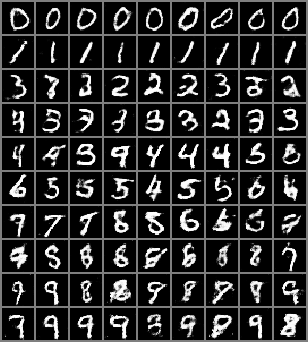

batch: 410/469, G_loss: 1.251590609550476, D_loss: 0.3967743515968323
batch: 420/469, G_loss: 1.7119383811950684, D_loss: 0.4643005132675171
batch: 430/469, G_loss: 1.6482850313186646, D_loss: 0.5173842310905457
batch: 440/469, G_loss: 1.3391567468643188, D_loss: 0.5046043992042542
batch: 450/469, G_loss: 0.8938881158828735, D_loss: 0.5084888935089111
batch: 460/469, G_loss: 1.734576940536499, D_loss: 0.4214235544204712
Epoch: 9 Time:  66.30938911437988
batch: 0/469, G_loss: 1.2969720363616943, D_loss: 0.5791776180267334


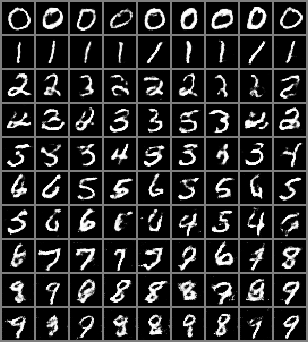

batch: 10/469, G_loss: 0.6021463871002197, D_loss: 0.6892867088317871
batch: 20/469, G_loss: 1.1989551782608032, D_loss: 0.4805927276611328
batch: 30/469, G_loss: 1.3142485618591309, D_loss: 0.48412054777145386
batch: 40/469, G_loss: 0.9342817664146423, D_loss: 0.5904554128646851
batch: 50/469, G_loss: 2.1156961917877197, D_loss: 0.5325828790664673
batch: 60/469, G_loss: 0.9783793687820435, D_loss: 0.4605729281902313
batch: 70/469, G_loss: 1.1124361753463745, D_loss: 0.4797089695930481
batch: 80/469, G_loss: 0.9822438955307007, D_loss: 0.5208803415298462
batch: 90/469, G_loss: 1.202394723892212, D_loss: 0.5780564546585083
batch: 100/469, G_loss: 1.552175760269165, D_loss: 0.5928822755813599


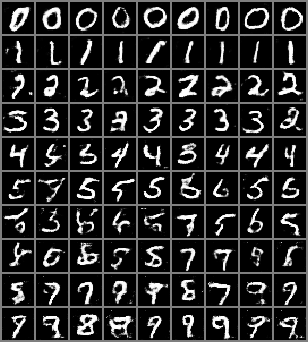

batch: 110/469, G_loss: 1.3348606824874878, D_loss: 0.50332111120224
batch: 120/469, G_loss: 1.507363200187683, D_loss: 0.514835774898529
batch: 130/469, G_loss: 1.7288141250610352, D_loss: 0.4853813648223877
batch: 140/469, G_loss: 1.4489011764526367, D_loss: 0.5113160014152527
batch: 150/469, G_loss: 1.0754847526550293, D_loss: 0.49744680523872375
batch: 160/469, G_loss: 1.4618175029754639, D_loss: 0.5001527667045593
batch: 170/469, G_loss: 0.62621009349823, D_loss: 0.5178037881851196
batch: 180/469, G_loss: 1.1765074729919434, D_loss: 0.46851861476898193
batch: 190/469, G_loss: 0.9944278597831726, D_loss: 0.5240371823310852
batch: 200/469, G_loss: 1.6692612171173096, D_loss: 0.5662851333618164


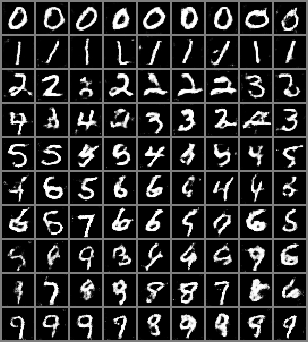

batch: 210/469, G_loss: 1.554302453994751, D_loss: 0.5099197030067444
batch: 220/469, G_loss: 0.5409219264984131, D_loss: 0.8191720843315125
batch: 230/469, G_loss: 1.7403106689453125, D_loss: 0.6579179763793945
batch: 240/469, G_loss: 1.378284215927124, D_loss: 0.5216456651687622
batch: 250/469, G_loss: 0.8482956886291504, D_loss: 0.5406162142753601
batch: 260/469, G_loss: 1.8405098915100098, D_loss: 0.5443682670593262
batch: 270/469, G_loss: 0.8528218865394592, D_loss: 0.6492751836776733
batch: 280/469, G_loss: 1.1069574356079102, D_loss: 0.5364387631416321
batch: 290/469, G_loss: 2.2655029296875, D_loss: 0.5734604001045227
batch: 300/469, G_loss: 1.1258728504180908, D_loss: 0.4427019953727722


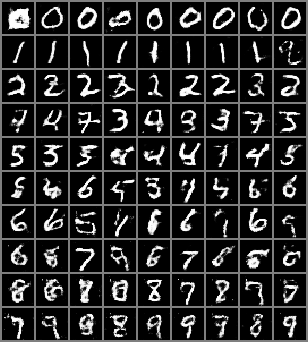

batch: 310/469, G_loss: 1.0906884670257568, D_loss: 0.499714732170105
batch: 320/469, G_loss: 1.391904592514038, D_loss: 0.5708404779434204
batch: 330/469, G_loss: 0.7618774175643921, D_loss: 0.5711449384689331
batch: 340/469, G_loss: 1.6867787837982178, D_loss: 0.4988425374031067
batch: 350/469, G_loss: 0.8649406433105469, D_loss: 0.4928593039512634
batch: 360/469, G_loss: 2.251664638519287, D_loss: 0.6260831952095032
batch: 370/469, G_loss: 1.182295322418213, D_loss: 0.5711135864257812
batch: 380/469, G_loss: 2.238100528717041, D_loss: 0.5987420678138733
batch: 390/469, G_loss: 1.6119920015335083, D_loss: 0.49988964200019836
batch: 400/469, G_loss: 0.8923699259757996, D_loss: 0.521609365940094


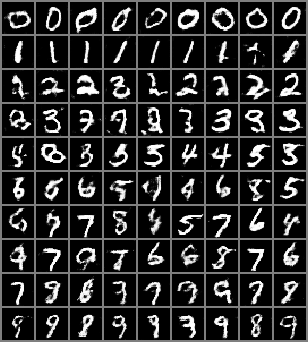

batch: 410/469, G_loss: 1.4653583765029907, D_loss: 0.41345593333244324
batch: 420/469, G_loss: 1.6671762466430664, D_loss: 0.5117120742797852
batch: 430/469, G_loss: 1.3103375434875488, D_loss: 0.49410292506217957
batch: 440/469, G_loss: 1.2362298965454102, D_loss: 0.47022169828414917
batch: 450/469, G_loss: 0.35610517859458923, D_loss: 0.6640933752059937
batch: 460/469, G_loss: 1.53970205783844, D_loss: 0.4385940432548523
Epoch: 10 Time:  66.14521598815918
batch: 0/469, G_loss: 0.7917194366455078, D_loss: 0.5838649868965149


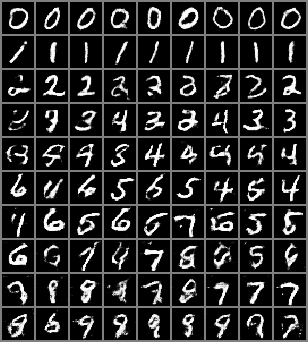

batch: 10/469, G_loss: 1.3149503469467163, D_loss: 0.5126994252204895
batch: 20/469, G_loss: 1.0084643363952637, D_loss: 0.4551782011985779
batch: 30/469, G_loss: 0.8147305250167847, D_loss: 0.5332784056663513
batch: 40/469, G_loss: 0.8843833804130554, D_loss: 0.5492877960205078
batch: 50/469, G_loss: 1.2728530168533325, D_loss: 0.47207552194595337
batch: 60/469, G_loss: 1.1980386972427368, D_loss: 0.5843474268913269
batch: 70/469, G_loss: 1.2230455875396729, D_loss: 0.490311861038208
batch: 80/469, G_loss: 1.2529631853103638, D_loss: 0.5181602239608765
batch: 90/469, G_loss: 1.1215405464172363, D_loss: 0.5345832109451294
batch: 100/469, G_loss: 1.4678049087524414, D_loss: 0.5291696786880493


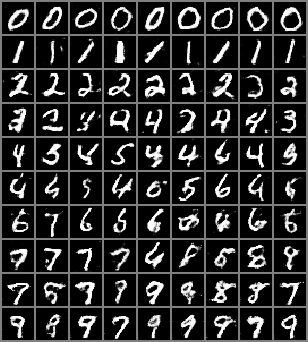

batch: 110/469, G_loss: 1.3503046035766602, D_loss: 0.5281341075897217
batch: 120/469, G_loss: 1.0072996616363525, D_loss: 0.5219813585281372
batch: 130/469, G_loss: 1.7782738208770752, D_loss: 0.5118531584739685
batch: 140/469, G_loss: 1.177735447883606, D_loss: 0.4667017459869385
batch: 150/469, G_loss: 1.151865005493164, D_loss: 0.5197377800941467
batch: 160/469, G_loss: 1.3411978483200073, D_loss: 0.42079412937164307
batch: 170/469, G_loss: 0.4449123740196228, D_loss: 0.6981754302978516
batch: 180/469, G_loss: 1.0898852348327637, D_loss: 0.5085089206695557
batch: 190/469, G_loss: 0.9316278100013733, D_loss: 0.5428814888000488
batch: 200/469, G_loss: 1.6038236618041992, D_loss: 0.5667935609817505


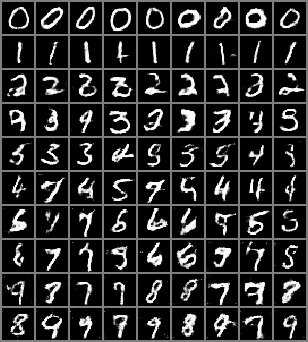

batch: 210/469, G_loss: 1.495678424835205, D_loss: 0.5780124068260193
batch: 220/469, G_loss: 0.4827888607978821, D_loss: 0.8236167430877686
batch: 230/469, G_loss: 1.3375232219696045, D_loss: 0.576637864112854
batch: 240/469, G_loss: 1.3516956567764282, D_loss: 0.5563321709632874
batch: 250/469, G_loss: 0.9706624746322632, D_loss: 0.614261269569397
batch: 260/469, G_loss: 1.3613982200622559, D_loss: 0.433386892080307
batch: 270/469, G_loss: 0.9494706392288208, D_loss: 0.5763711929321289
batch: 280/469, G_loss: 1.5957579612731934, D_loss: 0.5419971942901611
batch: 290/469, G_loss: 2.0024220943450928, D_loss: 0.5289375185966492
batch: 300/469, G_loss: 1.3281499147415161, D_loss: 0.5122469663619995


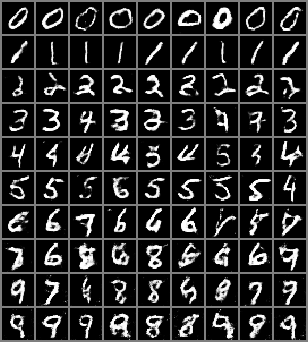

batch: 310/469, G_loss: 0.7498997449874878, D_loss: 0.5610200762748718
batch: 320/469, G_loss: 1.4234882593154907, D_loss: 0.48696938157081604
batch: 330/469, G_loss: 0.9752460718154907, D_loss: 0.5063812732696533
batch: 340/469, G_loss: 1.738663673400879, D_loss: 0.48209601640701294
batch: 350/469, G_loss: 0.9120509624481201, D_loss: 0.5431054830551147
batch: 360/469, G_loss: 2.1503100395202637, D_loss: 0.5053199529647827
batch: 370/469, G_loss: 0.8826115131378174, D_loss: 0.5604453682899475
batch: 380/469, G_loss: 1.7677946090698242, D_loss: 0.579240620136261
batch: 390/469, G_loss: 1.7008662223815918, D_loss: 0.4773651361465454
batch: 400/469, G_loss: 1.115405797958374, D_loss: 0.5131765604019165


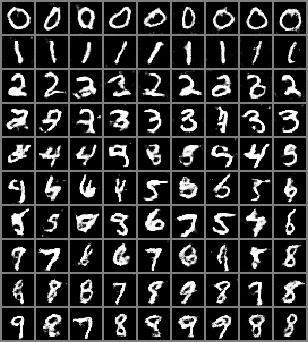

batch: 410/469, G_loss: 1.6691489219665527, D_loss: 0.43924999237060547
batch: 420/469, G_loss: 1.7632286548614502, D_loss: 0.49074655771255493
batch: 430/469, G_loss: 1.3825207948684692, D_loss: 0.4765036702156067
batch: 440/469, G_loss: 1.7521166801452637, D_loss: 0.48224908113479614
batch: 450/469, G_loss: 0.5127658843994141, D_loss: 0.5743207931518555
batch: 460/469, G_loss: 2.0842220783233643, D_loss: 0.44841262698173523
Epoch: 11 Time:  66.31528878211975
batch: 0/469, G_loss: 0.9142208695411682, D_loss: 0.6688539385795593


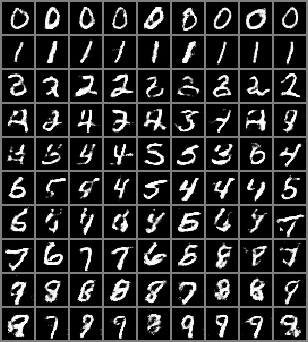

batch: 10/469, G_loss: 1.0946624279022217, D_loss: 0.5203207731246948
batch: 20/469, G_loss: 1.004429817199707, D_loss: 0.469704270362854
batch: 30/469, G_loss: 0.8127381205558777, D_loss: 0.45771148800849915
batch: 40/469, G_loss: 1.3211894035339355, D_loss: 0.48033344745635986
batch: 50/469, G_loss: 1.6327638626098633, D_loss: 0.5664034485816956
batch: 60/469, G_loss: 1.4499199390411377, D_loss: 0.4546010494232178
batch: 70/469, G_loss: 1.317749261856079, D_loss: 0.47635337710380554
batch: 80/469, G_loss: 1.1947410106658936, D_loss: 0.5190964937210083
batch: 90/469, G_loss: 1.952254056930542, D_loss: 0.6488016843795776
batch: 100/469, G_loss: 1.2040011882781982, D_loss: 0.4750504493713379


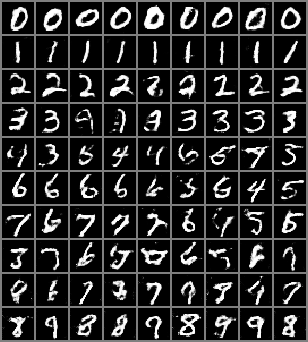

batch: 110/469, G_loss: 1.3023929595947266, D_loss: 0.4778141379356384
batch: 120/469, G_loss: 0.808258056640625, D_loss: 0.5675464868545532
batch: 130/469, G_loss: 1.2721449136734009, D_loss: 0.40235668420791626
batch: 140/469, G_loss: 0.9069128036499023, D_loss: 0.4533020555973053
batch: 150/469, G_loss: 0.9662821292877197, D_loss: 0.5219180583953857
batch: 160/469, G_loss: 1.174326777458191, D_loss: 0.4429674744606018
batch: 170/469, G_loss: 0.7204238772392273, D_loss: 0.5441235303878784
batch: 180/469, G_loss: 0.9265829920768738, D_loss: 0.5295823216438293
batch: 190/469, G_loss: 0.9639791250228882, D_loss: 0.4801706075668335
batch: 200/469, G_loss: 2.2588658332824707, D_loss: 0.5653129816055298


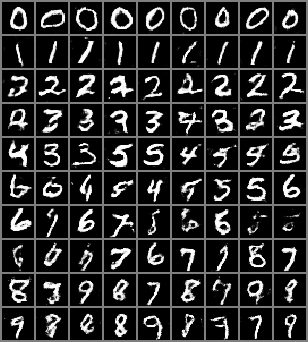

batch: 210/469, G_loss: 1.9345588684082031, D_loss: 0.5354115962982178
batch: 220/469, G_loss: 0.5581696033477783, D_loss: 0.5987319350242615
batch: 230/469, G_loss: 1.4694045782089233, D_loss: 0.55682373046875
batch: 240/469, G_loss: 1.33506178855896, D_loss: 0.47319740056991577
batch: 250/469, G_loss: 0.9108536243438721, D_loss: 0.5848344564437866
batch: 260/469, G_loss: 2.1081032752990723, D_loss: 0.5120102763175964
batch: 270/469, G_loss: 1.1969407796859741, D_loss: 0.514068603515625
batch: 280/469, G_loss: 2.218761682510376, D_loss: 0.537136435508728
batch: 290/469, G_loss: 1.908825159072876, D_loss: 0.6236721873283386
batch: 300/469, G_loss: 1.2906006574630737, D_loss: 0.4530216455459595


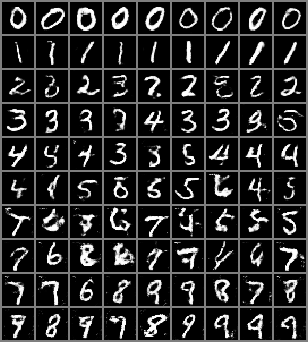

batch: 310/469, G_loss: 1.3616158962249756, D_loss: 0.5614156126976013
batch: 320/469, G_loss: 1.332758903503418, D_loss: 0.4624170660972595
batch: 330/469, G_loss: 0.8753088116645813, D_loss: 0.5682826638221741
batch: 340/469, G_loss: 1.5094218254089355, D_loss: 0.512531042098999
batch: 350/469, G_loss: 1.2285399436950684, D_loss: 0.4704650938510895
batch: 360/469, G_loss: 1.5528347492218018, D_loss: 0.4659733176231384
batch: 370/469, G_loss: 0.9712854623794556, D_loss: 0.47362667322158813
batch: 380/469, G_loss: 2.091017007827759, D_loss: 0.5339829921722412
batch: 390/469, G_loss: 1.88411545753479, D_loss: 0.5422393083572388
batch: 400/469, G_loss: 0.9940366744995117, D_loss: 0.6925594806671143


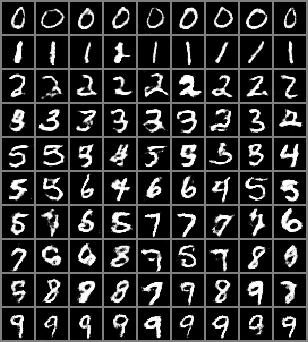

batch: 410/469, G_loss: 1.6471306085586548, D_loss: 0.44620031118392944
batch: 420/469, G_loss: 2.135185480117798, D_loss: 0.5394359230995178
batch: 430/469, G_loss: 2.1119980812072754, D_loss: 0.5988578200340271
batch: 440/469, G_loss: 1.949556827545166, D_loss: 0.5807844996452332
batch: 450/469, G_loss: 0.6215808391571045, D_loss: 0.6380981802940369
batch: 460/469, G_loss: 2.262350082397461, D_loss: 0.47953060269355774
Epoch: 12 Time:  66.28013467788696
batch: 0/469, G_loss: 0.7058887481689453, D_loss: 0.5669214129447937


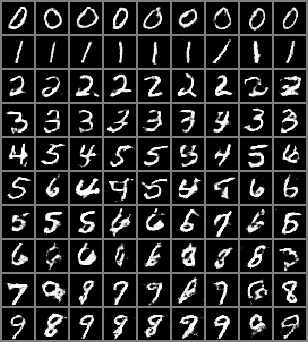

batch: 10/469, G_loss: 1.0649352073669434, D_loss: 0.5422880053520203
batch: 20/469, G_loss: 1.2338755130767822, D_loss: 0.4743496775627136
batch: 30/469, G_loss: 0.9549469947814941, D_loss: 0.4525375962257385
batch: 40/469, G_loss: 1.2795755863189697, D_loss: 0.5536319017410278
batch: 50/469, G_loss: 1.308037519454956, D_loss: 0.517219066619873
batch: 60/469, G_loss: 1.5987366437911987, D_loss: 0.5148746371269226
batch: 70/469, G_loss: 1.26339590549469, D_loss: 0.47351327538490295
batch: 80/469, G_loss: 1.3593525886535645, D_loss: 0.5183315277099609
batch: 90/469, G_loss: 1.8300974369049072, D_loss: 0.7399047613143921
batch: 100/469, G_loss: 1.2003915309906006, D_loss: 0.5274482369422913


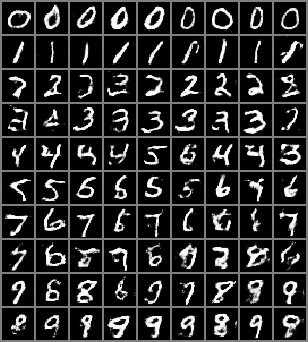

batch: 110/469, G_loss: 1.6057227849960327, D_loss: 0.483481764793396
batch: 120/469, G_loss: 0.7630876898765564, D_loss: 0.5830130577087402
batch: 130/469, G_loss: 1.9949281215667725, D_loss: 0.4965226948261261
batch: 140/469, G_loss: 1.2470343112945557, D_loss: 0.46713048219680786
batch: 150/469, G_loss: 1.1323347091674805, D_loss: 0.44015270471572876
batch: 160/469, G_loss: 0.878106951713562, D_loss: 0.43975237011909485
batch: 170/469, G_loss: 0.7639490962028503, D_loss: 0.5755164623260498
batch: 180/469, G_loss: 0.7593828439712524, D_loss: 0.5489749908447266
batch: 190/469, G_loss: 1.0822415351867676, D_loss: 0.451469749212265
batch: 200/469, G_loss: 1.3255473375320435, D_loss: 0.49007683992385864


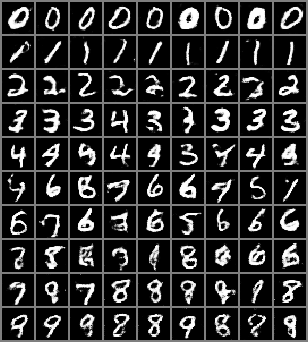

batch: 210/469, G_loss: 1.6134448051452637, D_loss: 0.5426974892616272
batch: 220/469, G_loss: 0.42713865637779236, D_loss: 0.8458466529846191
batch: 230/469, G_loss: 1.6546432971954346, D_loss: 0.6462221145629883
batch: 240/469, G_loss: 1.518080234527588, D_loss: 0.4932577610015869
batch: 250/469, G_loss: 0.6928659081459045, D_loss: 0.5031681656837463
batch: 260/469, G_loss: 1.8825404644012451, D_loss: 0.463255375623703
batch: 270/469, G_loss: 1.3236291408538818, D_loss: 0.5399606227874756
batch: 280/469, G_loss: 2.2180328369140625, D_loss: 0.5880081057548523
batch: 290/469, G_loss: 2.09980845451355, D_loss: 0.5060291290283203
batch: 300/469, G_loss: 1.014316201210022, D_loss: 0.4084594249725342


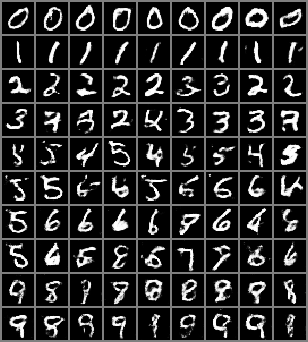

batch: 310/469, G_loss: 1.48141610622406, D_loss: 0.5360351204872131
batch: 320/469, G_loss: 0.984761118888855, D_loss: 0.48400211334228516
batch: 330/469, G_loss: 0.8879610300064087, D_loss: 0.6665143370628357
batch: 340/469, G_loss: 1.6990861892700195, D_loss: 0.457349568605423
batch: 350/469, G_loss: 1.1831892728805542, D_loss: 0.5852803587913513
batch: 360/469, G_loss: 2.032644748687744, D_loss: 0.5659404397010803
batch: 370/469, G_loss: 1.1221919059753418, D_loss: 0.5748714208602905
batch: 380/469, G_loss: 1.5684332847595215, D_loss: 0.4368509352207184
batch: 390/469, G_loss: 1.5654194355010986, D_loss: 0.46128296852111816
batch: 400/469, G_loss: 1.8708500862121582, D_loss: 0.5653401613235474


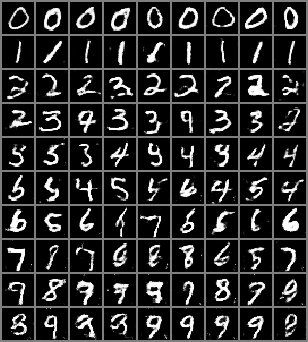

batch: 410/469, G_loss: 1.5145412683486938, D_loss: 0.35128819942474365
batch: 420/469, G_loss: 2.1258435249328613, D_loss: 0.44341331720352173
batch: 430/469, G_loss: 0.7842961549758911, D_loss: 0.47449424862861633
batch: 440/469, G_loss: 1.9506622552871704, D_loss: 0.5406575202941895
batch: 450/469, G_loss: 0.8854854702949524, D_loss: 0.5601803064346313
batch: 460/469, G_loss: 2.027273416519165, D_loss: 0.4019567370414734
Epoch: 13 Time:  66.26740074157715
batch: 0/469, G_loss: 0.8456920385360718, D_loss: 0.5899641513824463


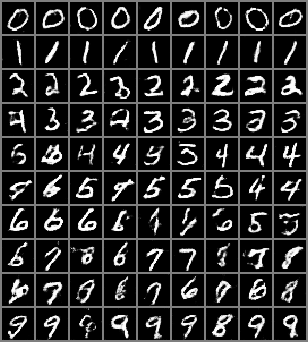

batch: 10/469, G_loss: 1.1108057498931885, D_loss: 0.5271198153495789
batch: 20/469, G_loss: 1.0466774702072144, D_loss: 0.5007107257843018
batch: 30/469, G_loss: 1.8563412427902222, D_loss: 0.4585709571838379
batch: 40/469, G_loss: 0.7224210500717163, D_loss: 0.6007752418518066
batch: 50/469, G_loss: 1.2145192623138428, D_loss: 0.44436782598495483
batch: 60/469, G_loss: 0.9366715550422668, D_loss: 0.46176213026046753
batch: 70/469, G_loss: 1.3222506046295166, D_loss: 0.5061529874801636
batch: 80/469, G_loss: 1.3088281154632568, D_loss: 0.5625849962234497
batch: 90/469, G_loss: 1.3906526565551758, D_loss: 0.5646803379058838
batch: 100/469, G_loss: 1.4013960361480713, D_loss: 0.4943167567253113


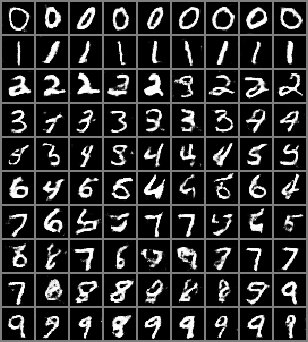

batch: 110/469, G_loss: 1.4858112335205078, D_loss: 0.4940866231918335
batch: 120/469, G_loss: 0.9862785339355469, D_loss: 0.5768505930900574
batch: 130/469, G_loss: 1.7829062938690186, D_loss: 0.4352381229400635
batch: 140/469, G_loss: 1.240377426147461, D_loss: 0.4648624062538147
batch: 150/469, G_loss: 1.2772486209869385, D_loss: 0.4767419099807739
batch: 160/469, G_loss: 1.2644827365875244, D_loss: 0.465309202671051
batch: 170/469, G_loss: 0.6716729998588562, D_loss: 0.4492984712123871
batch: 180/469, G_loss: 1.1050708293914795, D_loss: 0.44661396741867065
batch: 190/469, G_loss: 0.79780513048172, D_loss: 0.5161464810371399
batch: 200/469, G_loss: 1.5392279624938965, D_loss: 0.4920768439769745


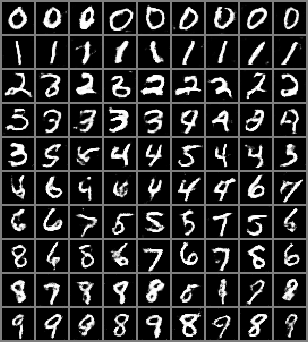

batch: 210/469, G_loss: 1.5827947854995728, D_loss: 0.4963746666908264
batch: 220/469, G_loss: 0.47816193103790283, D_loss: 0.7862270474433899
batch: 230/469, G_loss: 1.3030848503112793, D_loss: 0.569388747215271
batch: 240/469, G_loss: 1.2393100261688232, D_loss: 0.4444616436958313
batch: 250/469, G_loss: 0.5846481323242188, D_loss: 0.6369482278823853
batch: 260/469, G_loss: 1.3569343090057373, D_loss: 0.4409440755844116
batch: 270/469, G_loss: 0.530771791934967, D_loss: 0.5795085430145264
batch: 280/469, G_loss: 2.142942428588867, D_loss: 0.5020468235015869
batch: 290/469, G_loss: 1.4714691638946533, D_loss: 0.421085000038147
batch: 300/469, G_loss: 1.1197216510772705, D_loss: 0.4804067313671112


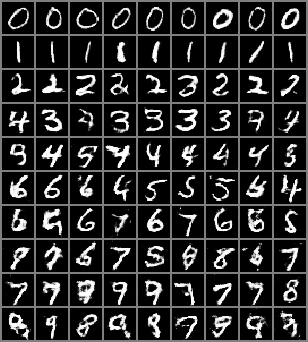

batch: 310/469, G_loss: 1.2405288219451904, D_loss: 0.5446112751960754
batch: 320/469, G_loss: 1.5000059604644775, D_loss: 0.43683409690856934
batch: 330/469, G_loss: 0.9042637348175049, D_loss: 0.46596717834472656
batch: 340/469, G_loss: 2.242175579071045, D_loss: 0.5525408983230591
batch: 350/469, G_loss: 1.8404849767684937, D_loss: 0.503015398979187
batch: 360/469, G_loss: 1.204860806465149, D_loss: 0.45107191801071167
batch: 370/469, G_loss: 0.9613819122314453, D_loss: 0.5703867673873901
batch: 380/469, G_loss: 2.081622838973999, D_loss: 0.4767013490200043
batch: 390/469, G_loss: 2.0168633460998535, D_loss: 0.5798532962799072
batch: 400/469, G_loss: 0.8206148147583008, D_loss: 0.5403229594230652


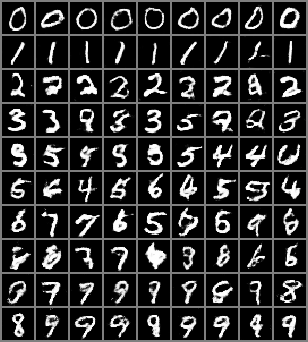

batch: 410/469, G_loss: 1.6469614505767822, D_loss: 0.3450057804584503
batch: 420/469, G_loss: 1.1467955112457275, D_loss: 0.367733895778656
batch: 430/469, G_loss: 0.9819019436836243, D_loss: 0.4714664816856384
batch: 440/469, G_loss: 1.5965826511383057, D_loss: 0.4866355061531067
batch: 450/469, G_loss: 0.8783824443817139, D_loss: 0.5379241704940796
batch: 460/469, G_loss: 1.720558524131775, D_loss: 0.39690688252449036
Epoch: 14 Time:  66.32813692092896
batch: 0/469, G_loss: 0.8513386249542236, D_loss: 0.5856599807739258


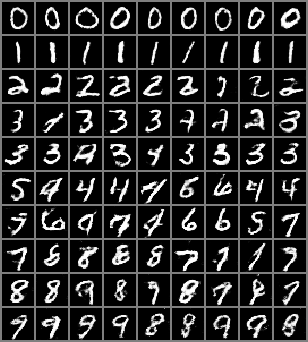

batch: 10/469, G_loss: 1.3457427024841309, D_loss: 0.5208423137664795
batch: 20/469, G_loss: 1.196101188659668, D_loss: 0.5520493388175964
batch: 30/469, G_loss: 1.2934060096740723, D_loss: 0.4278225302696228
batch: 40/469, G_loss: 1.288124918937683, D_loss: 0.5510385036468506
batch: 50/469, G_loss: 1.4040509462356567, D_loss: 0.4537590742111206
batch: 60/469, G_loss: 1.6245019435882568, D_loss: 0.49266743659973145
batch: 70/469, G_loss: 1.599655032157898, D_loss: 0.47697195410728455
batch: 80/469, G_loss: 1.560911774635315, D_loss: 0.5041491985321045
batch: 90/469, G_loss: 1.3151569366455078, D_loss: 0.5126371383666992
batch: 100/469, G_loss: 1.496778964996338, D_loss: 0.47357872128486633


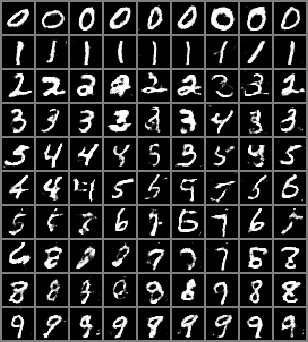

batch: 110/469, G_loss: 1.5551984310150146, D_loss: 0.44647109508514404
batch: 120/469, G_loss: 1.5111443996429443, D_loss: 0.39871835708618164
batch: 130/469, G_loss: 1.993394374847412, D_loss: 0.45653337240219116
batch: 140/469, G_loss: 1.0246590375900269, D_loss: 0.48008590936660767
batch: 150/469, G_loss: 1.9151902198791504, D_loss: 0.5646796226501465
batch: 160/469, G_loss: 1.724669098854065, D_loss: 0.4664461612701416
batch: 170/469, G_loss: 1.9721314907073975, D_loss: 0.5129048228263855
batch: 180/469, G_loss: 1.5852599143981934, D_loss: 0.43635091185569763
batch: 190/469, G_loss: 1.018245816230774, D_loss: 0.4603077471256256
batch: 200/469, G_loss: 1.50166916847229, D_loss: 0.44847342371940613


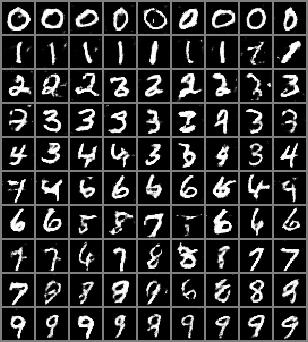

batch: 210/469, G_loss: 1.4313619136810303, D_loss: 0.49934929609298706
batch: 220/469, G_loss: 0.33844390511512756, D_loss: 0.8865471482276917
batch: 230/469, G_loss: 1.1304155588150024, D_loss: 0.46768465638160706
batch: 240/469, G_loss: 1.526307463645935, D_loss: 0.42912524938583374
batch: 250/469, G_loss: 1.5206058025360107, D_loss: 0.5965286493301392
batch: 260/469, G_loss: 1.3350725173950195, D_loss: 0.41837745904922485
batch: 270/469, G_loss: 1.0133507251739502, D_loss: 0.497616171836853
batch: 280/469, G_loss: 2.2058210372924805, D_loss: 0.5078703165054321
batch: 290/469, G_loss: 1.9680862426757812, D_loss: 0.6778867244720459
batch: 300/469, G_loss: 1.0766440629959106, D_loss: 0.39954203367233276


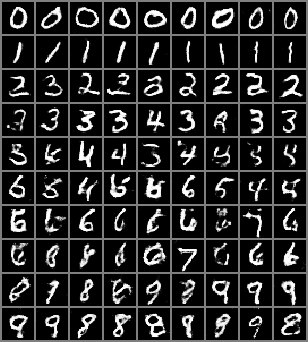

batch: 310/469, G_loss: 1.4957338571548462, D_loss: 0.4851597547531128
batch: 320/469, G_loss: 1.0326554775238037, D_loss: 0.45670485496520996
batch: 330/469, G_loss: 0.8047184944152832, D_loss: 0.5686330199241638
batch: 340/469, G_loss: 1.4806287288665771, D_loss: 0.4313942790031433
batch: 350/469, G_loss: 1.3887324333190918, D_loss: 0.41333556175231934
batch: 360/469, G_loss: 0.6082913875579834, D_loss: 0.6022372841835022
batch: 370/469, G_loss: 0.8614143133163452, D_loss: 0.5798232555389404
batch: 380/469, G_loss: 1.2928597927093506, D_loss: 0.44083288311958313
batch: 390/469, G_loss: 1.7619726657867432, D_loss: 0.48203304409980774
batch: 400/469, G_loss: 1.1172817945480347, D_loss: 0.48215770721435547


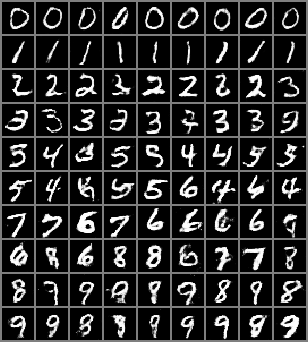

batch: 410/469, G_loss: 1.712409257888794, D_loss: 0.4116324484348297
batch: 420/469, G_loss: 2.0381481647491455, D_loss: 0.4434284567832947
batch: 430/469, G_loss: 2.023627281188965, D_loss: 0.5427621006965637
batch: 440/469, G_loss: 1.9596621990203857, D_loss: 0.552208423614502
batch: 450/469, G_loss: 0.7834570407867432, D_loss: 0.518130898475647
batch: 460/469, G_loss: 1.713214635848999, D_loss: 0.34966951608657837
Epoch: 15 Time:  66.2364068031311
batch: 0/469, G_loss: 1.2540881633758545, D_loss: 0.5824145078659058


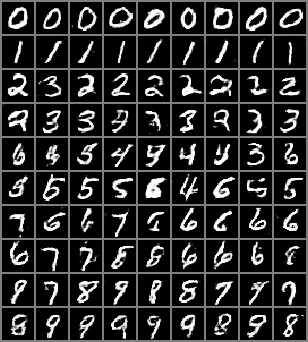

batch: 10/469, G_loss: 1.4767444133758545, D_loss: 0.5799575448036194
batch: 20/469, G_loss: 1.5112130641937256, D_loss: 0.39990144968032837
batch: 30/469, G_loss: 1.1732168197631836, D_loss: 0.47677987813949585
batch: 40/469, G_loss: 0.9378387331962585, D_loss: 0.597774088382721
batch: 50/469, G_loss: 1.3386704921722412, D_loss: 0.41250938177108765
batch: 60/469, G_loss: 1.435596227645874, D_loss: 0.5194293260574341
batch: 70/469, G_loss: 1.9645850658416748, D_loss: 0.48019230365753174
batch: 80/469, G_loss: 1.302884578704834, D_loss: 0.5280617475509644
batch: 90/469, G_loss: 1.6560641527175903, D_loss: 0.6195411682128906
batch: 100/469, G_loss: 1.3990910053253174, D_loss: 0.48173704743385315


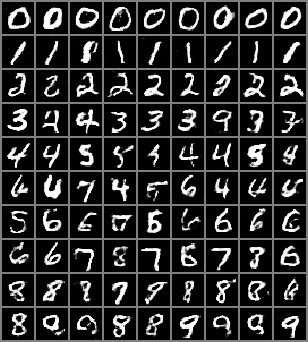

batch: 110/469, G_loss: 1.2662193775177002, D_loss: 0.4492914378643036
batch: 120/469, G_loss: 0.9730215668678284, D_loss: 0.48040735721588135
batch: 130/469, G_loss: 1.4301568269729614, D_loss: 0.40163543820381165
batch: 140/469, G_loss: 1.153087854385376, D_loss: 0.44326701760292053
batch: 150/469, G_loss: 1.3412396907806396, D_loss: 0.48256126046180725
batch: 160/469, G_loss: 1.2690807580947876, D_loss: 0.42539989948272705
batch: 170/469, G_loss: 1.4170598983764648, D_loss: 0.3831322193145752
batch: 180/469, G_loss: 2.0788304805755615, D_loss: 0.5278546214103699
batch: 190/469, G_loss: 1.315650463104248, D_loss: 0.4638095498085022
batch: 200/469, G_loss: 1.4007508754730225, D_loss: 0.47069251537323


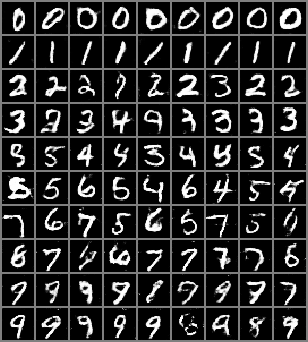

batch: 210/469, G_loss: 1.3268208503723145, D_loss: 0.4804171621799469
batch: 220/469, G_loss: 0.44391757249832153, D_loss: 0.903582751750946
batch: 230/469, G_loss: 1.784841537475586, D_loss: 0.6587109565734863
batch: 240/469, G_loss: 1.5124346017837524, D_loss: 0.45082011818885803
batch: 250/469, G_loss: 1.0793256759643555, D_loss: 0.5265321731567383
batch: 260/469, G_loss: 1.463397741317749, D_loss: 0.4812614619731903
batch: 270/469, G_loss: 0.9159518480300903, D_loss: 0.4743865728378296
batch: 280/469, G_loss: 1.3370405435562134, D_loss: 0.40857958793640137
batch: 290/469, G_loss: 1.8291511535644531, D_loss: 0.45692500472068787
batch: 300/469, G_loss: 1.2550348043441772, D_loss: 0.4658316969871521


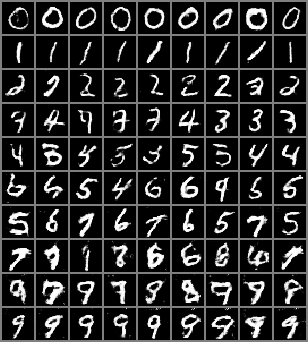

batch: 310/469, G_loss: 1.2518370151519775, D_loss: 0.4684857130050659
batch: 320/469, G_loss: 1.85128915309906, D_loss: 0.4260825514793396
batch: 330/469, G_loss: 1.0995490550994873, D_loss: 0.5289227962493896
batch: 340/469, G_loss: 2.5440175533294678, D_loss: 0.5647561550140381
batch: 350/469, G_loss: 1.0826544761657715, D_loss: 0.4669645428657532
batch: 360/469, G_loss: 1.7312328815460205, D_loss: 0.4861171245574951
batch: 370/469, G_loss: 1.6202261447906494, D_loss: 0.5817897915840149
batch: 380/469, G_loss: 1.8851771354675293, D_loss: 0.4420461058616638
batch: 390/469, G_loss: 2.3020222187042236, D_loss: 0.5104876756668091
batch: 400/469, G_loss: 1.7674124240875244, D_loss: 0.4891659915447235


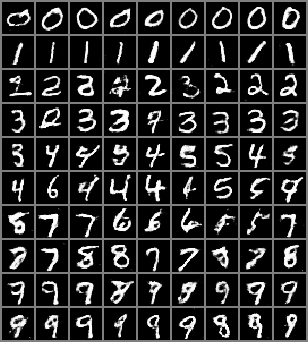

batch: 410/469, G_loss: 1.6426196098327637, D_loss: 0.37555545568466187
batch: 420/469, G_loss: 1.491335391998291, D_loss: 0.35260796546936035
batch: 430/469, G_loss: 1.3728621006011963, D_loss: 0.38407397270202637
batch: 440/469, G_loss: 2.2971575260162354, D_loss: 0.5865557193756104
batch: 450/469, G_loss: 1.3192651271820068, D_loss: 0.4921025037765503
batch: 460/469, G_loss: 2.343873977661133, D_loss: 0.4478904902935028
Epoch: 16 Time:  66.1412525177002
batch: 0/469, G_loss: 0.7290633320808411, D_loss: 0.6801589131355286


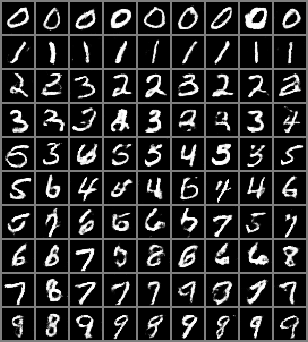

batch: 10/469, G_loss: 1.5582261085510254, D_loss: 0.5139763951301575
batch: 20/469, G_loss: 0.9867329597473145, D_loss: 0.5085724592208862
batch: 30/469, G_loss: 1.5259599685668945, D_loss: 0.4478709101676941
batch: 40/469, G_loss: 1.1865628957748413, D_loss: 0.5024018287658691
batch: 50/469, G_loss: 1.7327747344970703, D_loss: 0.44001176953315735
batch: 60/469, G_loss: 0.6947336196899414, D_loss: 0.5944458246231079
batch: 70/469, G_loss: 1.6753501892089844, D_loss: 0.3825443387031555
batch: 80/469, G_loss: 1.470763087272644, D_loss: 0.4415065050125122
batch: 90/469, G_loss: 1.1822102069854736, D_loss: 0.3669307231903076
batch: 100/469, G_loss: 1.706254243850708, D_loss: 0.47006845474243164


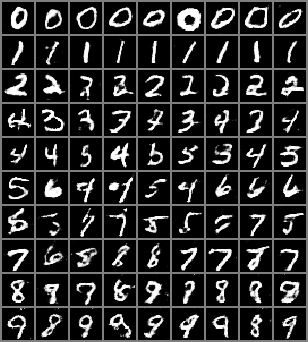

batch: 110/469, G_loss: 1.34157395362854, D_loss: 0.40087002515792847
batch: 120/469, G_loss: 1.022365927696228, D_loss: 0.456560879945755
batch: 130/469, G_loss: 1.8399978876113892, D_loss: 0.40270793437957764
batch: 140/469, G_loss: 1.7727611064910889, D_loss: 0.5131763219833374
batch: 150/469, G_loss: 1.4055335521697998, D_loss: 0.45302248001098633
batch: 160/469, G_loss: 1.6199822425842285, D_loss: 0.45146241784095764
batch: 170/469, G_loss: 0.3901057839393616, D_loss: 0.7208108901977539
batch: 180/469, G_loss: 0.6980152130126953, D_loss: 0.643129825592041
batch: 190/469, G_loss: 1.2570472955703735, D_loss: 0.3878163695335388
batch: 200/469, G_loss: 1.3915624618530273, D_loss: 0.4313907027244568


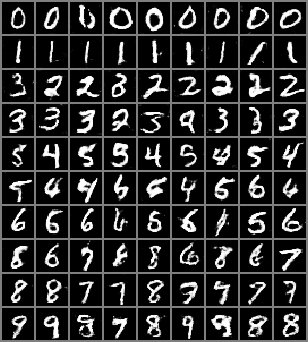

batch: 210/469, G_loss: 1.7503479719161987, D_loss: 0.47183310985565186
batch: 220/469, G_loss: 0.9313979148864746, D_loss: 0.5394081473350525
batch: 230/469, G_loss: 0.9783051013946533, D_loss: 0.44370388984680176
batch: 240/469, G_loss: 1.4829699993133545, D_loss: 0.42532867193222046
batch: 250/469, G_loss: 1.5679528713226318, D_loss: 0.5606042742729187
batch: 260/469, G_loss: 1.1878904104232788, D_loss: 0.5464509725570679
batch: 270/469, G_loss: 1.2283425331115723, D_loss: 0.4611015319824219
batch: 280/469, G_loss: 2.364436388015747, D_loss: 0.46027901768684387
batch: 290/469, G_loss: 1.6350775957107544, D_loss: 0.45708930492401123
batch: 300/469, G_loss: 1.4711813926696777, D_loss: 0.4957878589630127


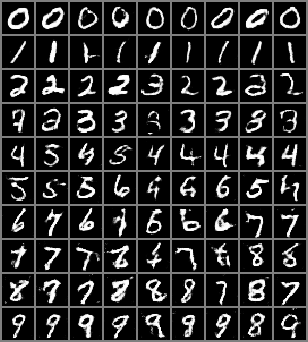

batch: 310/469, G_loss: 1.392798662185669, D_loss: 0.5342812538146973
batch: 320/469, G_loss: 1.1829898357391357, D_loss: 0.39711278676986694
batch: 330/469, G_loss: 1.0078730583190918, D_loss: 0.550420880317688
batch: 340/469, G_loss: 1.8845258951187134, D_loss: 0.4126584529876709
batch: 350/469, G_loss: 1.0068172216415405, D_loss: 0.459808886051178
batch: 360/469, G_loss: 1.8366632461547852, D_loss: 0.5147762298583984
batch: 370/469, G_loss: 1.1088329553604126, D_loss: 0.5079733729362488
batch: 380/469, G_loss: 2.182135581970215, D_loss: 0.4241344630718231
batch: 390/469, G_loss: 2.517754554748535, D_loss: 0.5096313953399658
batch: 400/469, G_loss: 1.4220514297485352, D_loss: 0.5216001272201538


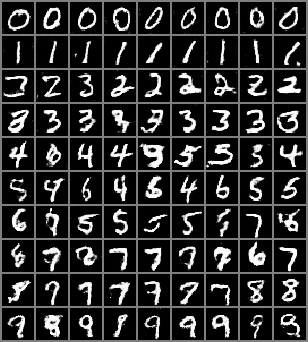

batch: 410/469, G_loss: 1.6397919654846191, D_loss: 0.3621795177459717
batch: 420/469, G_loss: 1.8612669706344604, D_loss: 0.3505074977874756
batch: 430/469, G_loss: 1.300343632698059, D_loss: 0.4034499526023865
batch: 440/469, G_loss: 2.3941476345062256, D_loss: 0.5291461944580078
batch: 450/469, G_loss: 0.9050923585891724, D_loss: 0.4436863362789154
batch: 460/469, G_loss: 1.8961869478225708, D_loss: 0.36420607566833496
Epoch: 17 Time:  66.32476997375488
batch: 0/469, G_loss: 0.8946651816368103, D_loss: 0.6084290146827698


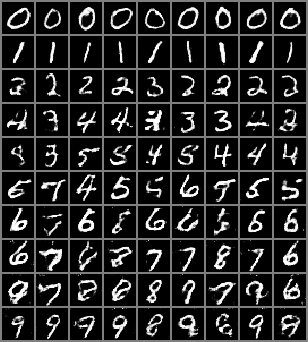

batch: 10/469, G_loss: 0.8877832889556885, D_loss: 0.5351331830024719
batch: 20/469, G_loss: 1.2337687015533447, D_loss: 0.5256152153015137
batch: 30/469, G_loss: 1.482332706451416, D_loss: 0.46035322546958923
batch: 40/469, G_loss: 1.1247148513793945, D_loss: 0.4531698226928711
batch: 50/469, G_loss: 1.631622552871704, D_loss: 0.43139374256134033
batch: 60/469, G_loss: 1.5776045322418213, D_loss: 0.4818687438964844
batch: 70/469, G_loss: 2.0379481315612793, D_loss: 0.4238618314266205
batch: 80/469, G_loss: 1.2076023817062378, D_loss: 0.4617540240287781
batch: 90/469, G_loss: 1.7540850639343262, D_loss: 0.5659810304641724
batch: 100/469, G_loss: 0.9861836433410645, D_loss: 0.46531832218170166


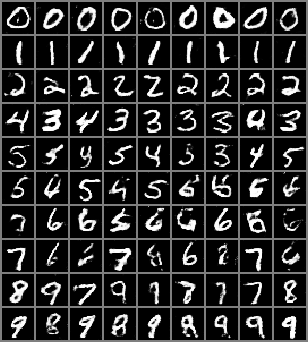

batch: 110/469, G_loss: 1.9496383666992188, D_loss: 0.4037740230560303
batch: 120/469, G_loss: 1.1604759693145752, D_loss: 0.4574016332626343
batch: 130/469, G_loss: 1.948786973953247, D_loss: 0.4047185182571411
batch: 140/469, G_loss: 2.080826997756958, D_loss: 0.5360217690467834
batch: 150/469, G_loss: 1.5418872833251953, D_loss: 0.47052866220474243
batch: 160/469, G_loss: 1.2892982959747314, D_loss: 0.39435356855392456
batch: 170/469, G_loss: 1.046560287475586, D_loss: 0.5223724842071533
batch: 180/469, G_loss: 1.1968865394592285, D_loss: 0.44089823961257935
batch: 190/469, G_loss: 1.0856295824050903, D_loss: 0.599817156791687
batch: 200/469, G_loss: 1.2526614665985107, D_loss: 0.4683534502983093


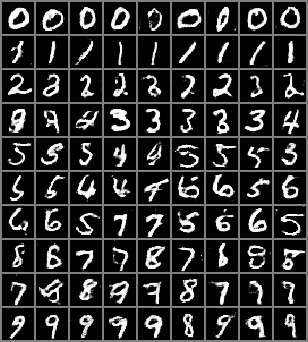

batch: 210/469, G_loss: 2.2928578853607178, D_loss: 0.4930216073989868
batch: 220/469, G_loss: 1.0514354705810547, D_loss: 0.6204832792282104
batch: 230/469, G_loss: 1.545931100845337, D_loss: 0.4711466431617737
batch: 240/469, G_loss: 1.405332088470459, D_loss: 0.4235129654407501
batch: 250/469, G_loss: 1.32233726978302, D_loss: 0.43226584792137146
batch: 260/469, G_loss: 1.542067050933838, D_loss: 0.4049724042415619
batch: 270/469, G_loss: 0.8763388991355896, D_loss: 0.4691339135169983
batch: 280/469, G_loss: 2.390566825866699, D_loss: 0.4724773168563843
batch: 290/469, G_loss: 1.6320029497146606, D_loss: 0.383425235748291
batch: 300/469, G_loss: 1.2674670219421387, D_loss: 0.4036328196525574


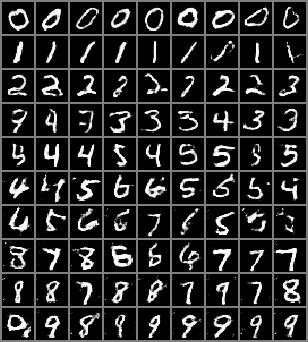

batch: 310/469, G_loss: 1.020782709121704, D_loss: 0.4500789940357208
batch: 320/469, G_loss: 1.2946248054504395, D_loss: 0.4220871925354004
batch: 330/469, G_loss: 1.0594035387039185, D_loss: 0.47031158208847046
batch: 340/469, G_loss: 2.079751968383789, D_loss: 0.420488178730011
batch: 350/469, G_loss: 1.5447243452072144, D_loss: 0.44789642095565796
batch: 360/469, G_loss: 1.1913021802902222, D_loss: 0.4765356183052063
batch: 370/469, G_loss: 1.022229552268982, D_loss: 0.5312495827674866
batch: 380/469, G_loss: 1.80193293094635, D_loss: 0.5248984098434448
batch: 390/469, G_loss: 2.3499879837036133, D_loss: 0.46786412596702576
batch: 400/469, G_loss: 1.201156735420227, D_loss: 0.5654069781303406


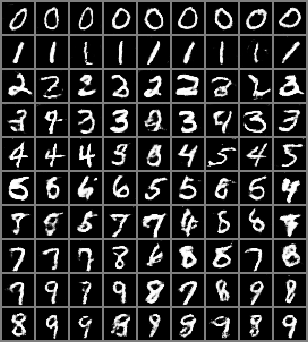

batch: 410/469, G_loss: 1.1992480754852295, D_loss: 0.46276894211769104
batch: 420/469, G_loss: 1.9158656597137451, D_loss: 0.4001169800758362
batch: 430/469, G_loss: 2.0775387287139893, D_loss: 0.46556356549263
batch: 440/469, G_loss: 2.279001474380493, D_loss: 0.5803210735321045
batch: 450/469, G_loss: 0.5916599035263062, D_loss: 0.4371011257171631
batch: 460/469, G_loss: 2.4536514282226562, D_loss: 0.4606555104255676
Epoch: 18 Time:  66.33177733421326
batch: 0/469, G_loss: 0.8959399461746216, D_loss: 0.5060843229293823


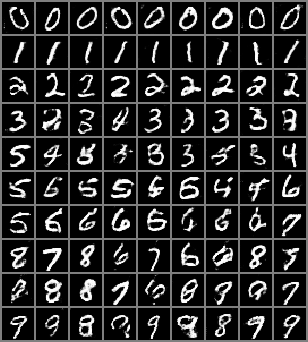

batch: 10/469, G_loss: 1.1623313426971436, D_loss: 0.4258284568786621
batch: 20/469, G_loss: 1.464653730392456, D_loss: 0.4068109095096588
batch: 30/469, G_loss: 1.5384420156478882, D_loss: 0.40994590520858765
batch: 40/469, G_loss: 1.2513954639434814, D_loss: 0.49846380949020386
batch: 50/469, G_loss: 1.6060841083526611, D_loss: 0.3506656289100647
batch: 60/469, G_loss: 1.8979785442352295, D_loss: 0.451555997133255
batch: 70/469, G_loss: 1.6598966121673584, D_loss: 0.31922534108161926
batch: 80/469, G_loss: 1.2599797248840332, D_loss: 0.43809643387794495
batch: 90/469, G_loss: 0.8276407718658447, D_loss: 0.46113884449005127
batch: 100/469, G_loss: 1.9878849983215332, D_loss: 0.4338259696960449


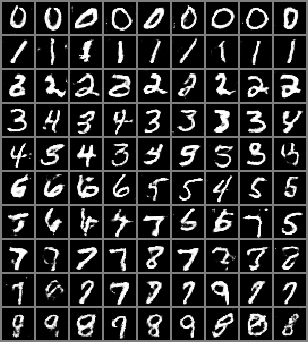

batch: 110/469, G_loss: 1.9310697317123413, D_loss: 0.4580562114715576
batch: 120/469, G_loss: 2.2127485275268555, D_loss: 0.5145173072814941
batch: 130/469, G_loss: 1.8692065477371216, D_loss: 0.42967551946640015
batch: 140/469, G_loss: 1.798061490058899, D_loss: 0.4821140766143799
batch: 150/469, G_loss: 1.873924732208252, D_loss: 0.49644529819488525
batch: 160/469, G_loss: 1.9879571199417114, D_loss: 0.468906968832016
batch: 170/469, G_loss: 1.8701077699661255, D_loss: 0.5588356256484985
batch: 180/469, G_loss: 0.9217362403869629, D_loss: 0.5020875334739685
batch: 190/469, G_loss: 1.0438498258590698, D_loss: 0.44283682107925415
batch: 200/469, G_loss: 1.7042814493179321, D_loss: 0.4403955638408661


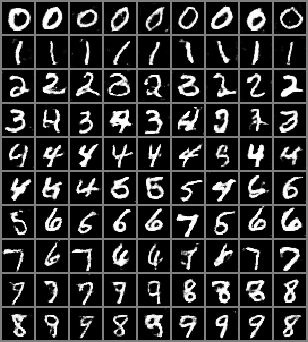

batch: 210/469, G_loss: 0.547669529914856, D_loss: 0.4744780659675598
batch: 220/469, G_loss: 0.7600114345550537, D_loss: 0.6540055274963379
batch: 230/469, G_loss: 1.467055082321167, D_loss: 0.4601259231567383
batch: 240/469, G_loss: 1.2489962577819824, D_loss: 0.38518407940864563
batch: 250/469, G_loss: 1.5451046228408813, D_loss: 0.5005077719688416
batch: 260/469, G_loss: 1.3352535963058472, D_loss: 0.385492742061615
batch: 270/469, G_loss: 1.60331392288208, D_loss: 0.47995686531066895
batch: 280/469, G_loss: 1.9899227619171143, D_loss: 0.44337528944015503
batch: 290/469, G_loss: 2.358097553253174, D_loss: 0.4291224777698517
batch: 300/469, G_loss: 1.6948826313018799, D_loss: 0.44877058267593384


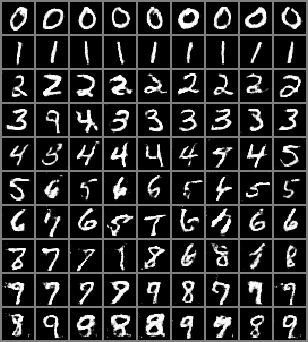

batch: 310/469, G_loss: 1.5752477645874023, D_loss: 0.4738655686378479
batch: 320/469, G_loss: 1.1571357250213623, D_loss: 0.375129371881485
batch: 330/469, G_loss: 1.228087067604065, D_loss: 0.5006816387176514
batch: 340/469, G_loss: 1.5827341079711914, D_loss: 0.37968534231185913
batch: 350/469, G_loss: 1.207613468170166, D_loss: 0.5206295251846313
batch: 360/469, G_loss: 1.2896296977996826, D_loss: 0.4886954426765442
batch: 370/469, G_loss: 1.0384564399719238, D_loss: 0.4807765483856201
batch: 380/469, G_loss: 2.0446717739105225, D_loss: 0.42225080728530884
batch: 390/469, G_loss: 3.1649417877197266, D_loss: 0.6722632050514221
batch: 400/469, G_loss: 1.1536481380462646, D_loss: 0.5693235993385315


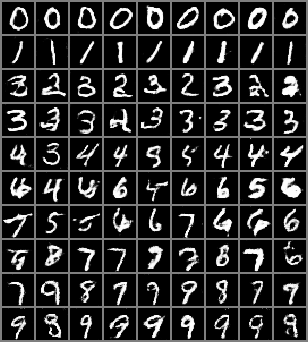

batch: 410/469, G_loss: 1.4006571769714355, D_loss: 0.41175204515457153
batch: 420/469, G_loss: 1.3325085639953613, D_loss: 0.30026528239250183
batch: 430/469, G_loss: 0.9755005836486816, D_loss: 0.3901333808898926
batch: 440/469, G_loss: 2.1945676803588867, D_loss: 0.44457000494003296
batch: 450/469, G_loss: 0.8543668985366821, D_loss: 0.4736447334289551
batch: 460/469, G_loss: 2.19179630279541, D_loss: 0.31693512201309204
Epoch: 19 Time:  66.42350435256958
batch: 0/469, G_loss: 0.5797402858734131, D_loss: 0.5401105880737305


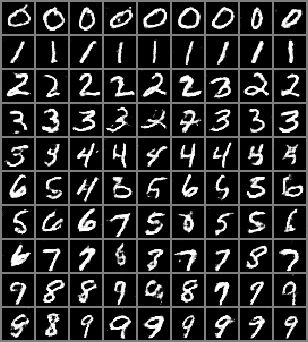

batch: 10/469, G_loss: 1.0014657974243164, D_loss: 0.4012983739376068
batch: 20/469, G_loss: 1.4122122526168823, D_loss: 0.5073724985122681
batch: 30/469, G_loss: 2.315577268600464, D_loss: 0.4157552421092987
batch: 40/469, G_loss: 0.9712194800376892, D_loss: 0.5101754069328308
batch: 50/469, G_loss: 1.3993759155273438, D_loss: 0.37640559673309326
batch: 60/469, G_loss: 2.1220388412475586, D_loss: 0.4949421286582947
batch: 70/469, G_loss: 1.5499922037124634, D_loss: 0.3916967213153839
batch: 80/469, G_loss: 1.2279101610183716, D_loss: 0.4676675796508789
batch: 90/469, G_loss: 1.446913480758667, D_loss: 0.4056078791618347
batch: 100/469, G_loss: 1.7114890813827515, D_loss: 0.4969448745250702


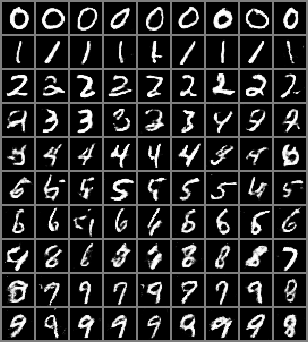

batch: 110/469, G_loss: 1.446810245513916, D_loss: 0.3795202374458313
batch: 120/469, G_loss: 1.1458736658096313, D_loss: 0.33354032039642334
batch: 130/469, G_loss: 1.9554022550582886, D_loss: 0.3654005825519562
batch: 140/469, G_loss: 0.9669774770736694, D_loss: 0.4122529625892639
batch: 150/469, G_loss: 1.2226996421813965, D_loss: 0.4484703838825226
batch: 160/469, G_loss: 1.9802926778793335, D_loss: 0.5603928565979004
batch: 170/469, G_loss: 1.8984160423278809, D_loss: 0.3483140468597412
batch: 180/469, G_loss: 1.2694799900054932, D_loss: 0.49163535237312317
batch: 190/469, G_loss: 1.2280213832855225, D_loss: 0.3607828915119171
batch: 200/469, G_loss: 1.3074188232421875, D_loss: 0.36595240235328674


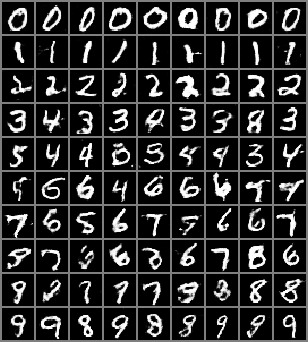

batch: 210/469, G_loss: 1.8317475318908691, D_loss: 0.4396008849143982
batch: 220/469, G_loss: 1.1429394483566284, D_loss: 0.4330842196941376
batch: 230/469, G_loss: 1.0373221635818481, D_loss: 0.43228453397750854
batch: 240/469, G_loss: 2.1002297401428223, D_loss: 0.3739403486251831
batch: 250/469, G_loss: 1.8596419095993042, D_loss: 0.4942747950553894
batch: 260/469, G_loss: 1.5054905414581299, D_loss: 0.39807072281837463
batch: 270/469, G_loss: 1.6418250799179077, D_loss: 0.38437405228614807
batch: 280/469, G_loss: 2.8413143157958984, D_loss: 0.4625823497772217
batch: 290/469, G_loss: 1.3270683288574219, D_loss: 0.39959946274757385
batch: 300/469, G_loss: 1.4741718769073486, D_loss: 0.4212896227836609


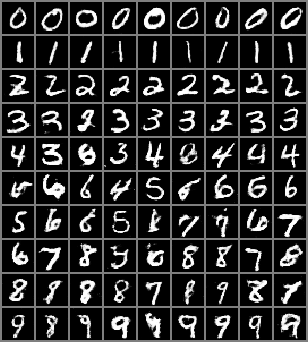

batch: 310/469, G_loss: 1.3632888793945312, D_loss: 0.519336462020874
batch: 320/469, G_loss: 1.683738350868225, D_loss: 0.3979721665382385
batch: 330/469, G_loss: 1.6268188953399658, D_loss: 0.3850875794887543
batch: 340/469, G_loss: 1.9414185285568237, D_loss: 0.3961150646209717
batch: 350/469, G_loss: 2.1231400966644287, D_loss: 0.39935606718063354
batch: 360/469, G_loss: 2.7736265659332275, D_loss: 0.5078678131103516
batch: 370/469, G_loss: 1.522467851638794, D_loss: 0.5253809094429016
batch: 380/469, G_loss: 2.867342948913574, D_loss: 0.45426952838897705
batch: 390/469, G_loss: 2.8111441135406494, D_loss: 0.5605031251907349
batch: 400/469, G_loss: 0.9162018895149231, D_loss: 0.5308910608291626


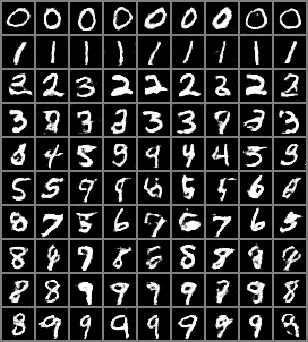

batch: 410/469, G_loss: 2.3197755813598633, D_loss: 0.463325172662735
batch: 420/469, G_loss: 1.538238286972046, D_loss: 0.2850135564804077
batch: 430/469, G_loss: 1.2139557600021362, D_loss: 0.4245544373989105
batch: 440/469, G_loss: 1.8354015350341797, D_loss: 0.4853751063346863
batch: 450/469, G_loss: 1.0069494247436523, D_loss: 0.3589545488357544
batch: 460/469, G_loss: 2.519996166229248, D_loss: 0.3186403512954712
Epoch: 20 Time:  66.46334910392761


In [0]:
#TRAINING


# network
Generator = generator()
Discriminator = discriminator()

Generator.weight_initialization(mean=0.0, std=0.02)
Discriminator.weight_initialization(mean=0.0, std=0.02)

Generator.to(device)
Discriminator.to(device)

# Binary Cross Entropy loss
criterion = nn.BCELoss()

# Adam optimizer
optimizer_G = optim.Adam(Generator.parameters(), lr=hparams['learning_rate'], betas=(0.5, 0.999))
optimizer_D = optim.Adam(Discriminator.parameters(), lr=hparams['learning_rate'], betas=(0.5, 0.999))

start_time = time.time()
for epoch in range(1, hparams['num_epochs'] + 1):
  epoch_start_time = time.time()
  D_losses, G_losses=train_epoch_net(Generator,Discriminator,optimizer_D, optimizer_G,criterion, train_loader_gan)
  epoch_end_time = time.time()
  print("Epoch:", epoch, "Time: ", epoch_end_time - epoch_start_time)




